<a href="https://colab.research.google.com/github/ADARSHBNM/assignment_files/blob/main/Cluster_Analysis_f.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import seaborn as sns
import plotly.express as px
plt.rcParams['figure.figsize'] = (12,8)

# Data

In [ ]:
df = pd.read_excel('./World_development_mesurement.xlsx')
df.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

## Check For NULLS & Duplicates

In [ ]:
nulls = df.isna().sum().to_frame()
nulls.rename(columns={0:'SUM'},inplace=True)
nulls['%null'] = nulls['SUM'].apply(lambda x : (x/df.shape[0])*100)
nulls

,SUM,%null
Birth Rate,119,4.400888
Business Tax Rate,1281,47.374260
CO2 Emissions,579,21.412722
Country,0,0.000000
Days to Start Business,986,36.464497
Ease of Business,2519,93.158284
Energy Usage,919,33.986686
GDP,210,7.766272
Health Exp % GDP,309,11.427515
Health Exp/Capita,309,11.427515


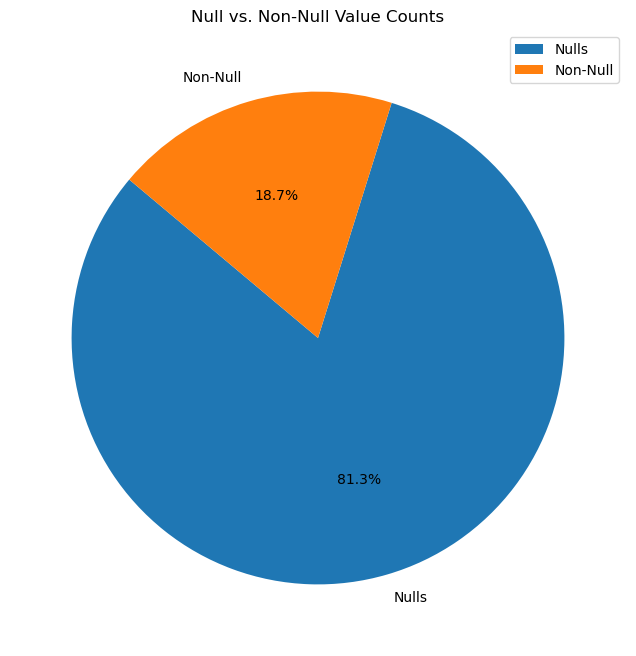

In [ ]:
label = ['Nulls','Non-Null']
datas = [np.sum(nulls['SUM']), df.shape[0]]
plt.pie(datas, labels=label, autopct='%1.1f%%', startangle=140)
plt.title("Null vs. Non-Null Value Counts")
plt.legend()
plt.show()

*Large amount of nulls.*

In [ ]:
df[df.duplicated()]

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound


In [ ]:
non_numeric = [x for x in df.columns if not pd.api.types.is_numeric_dtype(df[x])]
numeric = [x for x in df.columns if pd.api.types.is_numeric_dtype(df[x])]

In [ ]:
non_numeric

['Business Tax Rate',
 'Country',
 'GDP',
 'Health Exp/Capita',
 'Tourism Inbound',
 'Tourism Outbound']

In [ ]:
numeric

['Birth Rate',
 'CO2 Emissions',
 'Days to Start Business',
 'Ease of Business',
 'Energy Usage',
 'Health Exp % GDP',
 'Hours to do Tax',
 'Infant Mortality Rate',
 'Internet Usage',
 'Lending Interest',
 'Life Expectancy Female',
 'Life Expectancy Male',
 'Mobile Phone Usage',
 'Number of Records',
 'Population 0-14',
 'Population 15-64',
 'Population 65+',
 'Population Total',
 'Population Urban']

**Before handling null values we need to make sure data types for the column are validated**

# 1. Data Type Validation

## Non Numeric Cols

There are some columns which should be numeric but are not because of some strings attached to them

In [ ]:
non_numeric

['Business Tax Rate',
 'Country',
 'GDP',
 'Health Exp/Capita',
 'Tourism Inbound',
 'Tourism Outbound']

### 1. Business Tax Rate

In [ ]:
df[non_numeric[0]]

0         NaN
1         NaN
2         NaN
3         NaN
4         NaN
        ...  
2699      NaN
2700    46.4%
2701    41.9%
2702    61.9%
2703      NaN
Name: Business Tax Rate, Length: 2704, dtype: object

**Value is numeric but is parsed as object due to % string attached to it**

In [ ]:
if df[non_numeric[0]].dtype == 'O':        #perform only if column is non numeric
    for i in tqdm(range(df.shape[0])):
        temp = df.loc[i,non_numeric[0]]
        if not pd.isna(temp):
            df.loc[i,non_numeric[0]] = temp[:-1]
    df[non_numeric[0]] = df[non_numeric[0]].astype(float)

100%|███████████████████████████████████████████████████████████████████████████| 2704/2704 [00:00<00:00, 10518.47it/s]


In [ ]:
df[non_numeric[0]]

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
2699     NaN
2700    46.4
2701    41.9
2702    61.9
2703     NaN
Name: Business Tax Rate, Length: 2704, dtype: float64

*Now the Values are in correct dtype*

### 2. Country

In [ ]:
df[non_numeric[1]]

0                        Algeria
1                         Angola
2                          Benin
3                       Botswana
4                   Burkina Faso
                  ...           
2699    Turks and Caicos Islands
2700               United States
2701                     Uruguay
2702               Venezuela, RB
2703       Virgin Islands (U.S.)
Name: Country, Length: 2704, dtype: object

*These values are correctly parsed*

### 3. GDP

In [ ]:
df[non_numeric[2]]

0           $54,790,058,957
1            $9,129,594,819
2            $2,359,122,303
3            $5,788,311,645
4            $2,610,959,139
               ...         
2699                    NaN
2700    $16,244,600,000,000
2701        $50,004,354,667
2702       $381,286,223,859
2703                    NaN
Name: GDP, Length: 2704, dtype: object

**Values should be numeric but are not due to $**

In [ ]:
if df[non_numeric[2]].dtype == 'O':
    for i in tqdm(range(df.shape[0])):
        temp = df.loc[i,non_numeric[2]]
        if not pd.isna(temp):
            df.loc[i,non_numeric[2]] = temp[1:].replace(',','')
    df[non_numeric[2]] = df[non_numeric[2]].astype(float)

100%|████████████████████████████████████████████████████████████████████████████| 2704/2704 [00:00<00:00, 7248.83it/s]


In [ ]:
df[non_numeric[2]]

0       5.479006e+10
1       9.129595e+09
2       2.359122e+09
3       5.788312e+09
4       2.610959e+09
            ...     
2699             NaN
2700    1.624460e+13
2701    5.000435e+10
2702    3.812862e+11
2703             NaN
Name: GDP, Length: 2704, dtype: float64

*Now the Values are in correct dtype*

### 4. Health Exp/Capita

In [ ]:
df[non_numeric[3]]

0          $60
1          $22
2          $15
3         $152
4          $12
         ...  
2699       NaN
2700    $8,895
2701    $1,308
2702      $593
2703       NaN
Name: Health Exp/Capita, Length: 2704, dtype: object

**Values should be numeric but are not due to $**

In [ ]:
if df[non_numeric[3]].dtype == 'O':
    for i in tqdm(range(df.shape[0])):
        temp = df.loc[i,non_numeric[3]]
        if not pd.isna(temp):
            df.loc[i,non_numeric[3]] = temp[1:].replace(',','')
    df[non_numeric[3]] = df[non_numeric[3]].astype(float)

100%|████████████████████████████████████████████████████████████████████████████| 2704/2704 [00:00<00:00, 7905.61it/s]


In [ ]:
df[non_numeric[3]]

0         60.0
1         22.0
2         15.0
3        152.0
4         12.0
         ...  
2699       NaN
2700    8895.0
2701    1308.0
2702     593.0
2703       NaN
Name: Health Exp/Capita, Length: 2704, dtype: float64

*Now the Values are in correct dtype*

### 5. Tourism Inbound

In [ ]:
df[non_numeric[4]]

0           $102,000,000
1            $34,000,000
2            $77,000,000
3           $227,000,000
4            $23,000,000
              ...       
2699                 NaN
2700    $200,092,000,000
2701      $2,222,000,000
2702        $904,000,000
2703                 NaN
Name: Tourism Inbound, Length: 2704, dtype: object

**Values should be numeric but are not due to $**

In [ ]:
if df[non_numeric[4]].dtype == 'O':
    for i in tqdm(range(df.shape[0])):
        temp = df.loc[i,non_numeric[4]]
        if not pd.isna(temp):
            df.loc[i,non_numeric[4]] = temp[1:].replace(',','')
    df[non_numeric[4]] = df[non_numeric[4]].astype(float)

100%|████████████████████████████████████████████████████████████████████████████| 2704/2704 [00:00<00:00, 7871.07it/s]


In [ ]:
df[non_numeric[4]]

0       1.020000e+08
1       3.400000e+07
2       7.700000e+07
3       2.270000e+08
4       2.300000e+07
            ...     
2699             NaN
2700    2.000920e+11
2701    2.222000e+09
2702    9.040000e+08
2703             NaN
Name: Tourism Inbound, Length: 2704, dtype: float64

*Now the Values are in correct dtype*

### 6. Tourism Outbound

In [ ]:
df[non_numeric[-1]]

0           $193,000,000
1           $146,000,000
2            $50,000,000
3           $209,000,000
4            $30,000,000
              ...       
2699                 NaN
2700    $126,573,000,000
2701      $1,028,000,000
2702      $3,202,000,000
2703                 NaN
Name: Tourism Outbound, Length: 2704, dtype: object

**Values should be numeric but are not due to $**

In [ ]:
if df[non_numeric[5]].dtype == 'O':
    for i in tqdm(range(df.shape[0])):
        temp = df.loc[i,non_numeric[5]]
        if not pd.isna(temp):
            df.loc[i,non_numeric[5]] = temp[1:].replace(',','')
    df[non_numeric[5]] = df[non_numeric[5]].astype(float)

100%|███████████████████████████████████████████████████████████████████████████| 2704/2704 [00:00<00:00, 10990.04it/s]


In [ ]:
df[non_numeric[5]]

0       1.930000e+08
1       1.460000e+08
2       5.000000e+07
3       2.090000e+08
4       3.000000e+07
            ...     
2699             NaN
2700    1.265730e+11
2701    1.028000e+09
2702    3.202000e+09
2703             NaN
Name: Tourism Outbound, Length: 2704, dtype: float64

**Now That All the columns are in valid datatype we can move forward with the analysis**

# 2. Handling Nulls

In [ ]:
nulls

,SUM,%null
Birth Rate,119,4.400888
Business Tax Rate,1281,47.374260
CO2 Emissions,579,21.412722
Country,0,0.000000
Days to Start Business,986,36.464497
Ease of Business,2519,93.158284
Energy Usage,919,33.986686
GDP,210,7.766272
Health Exp % GDP,309,11.427515
Health Exp/Capita,309,11.427515


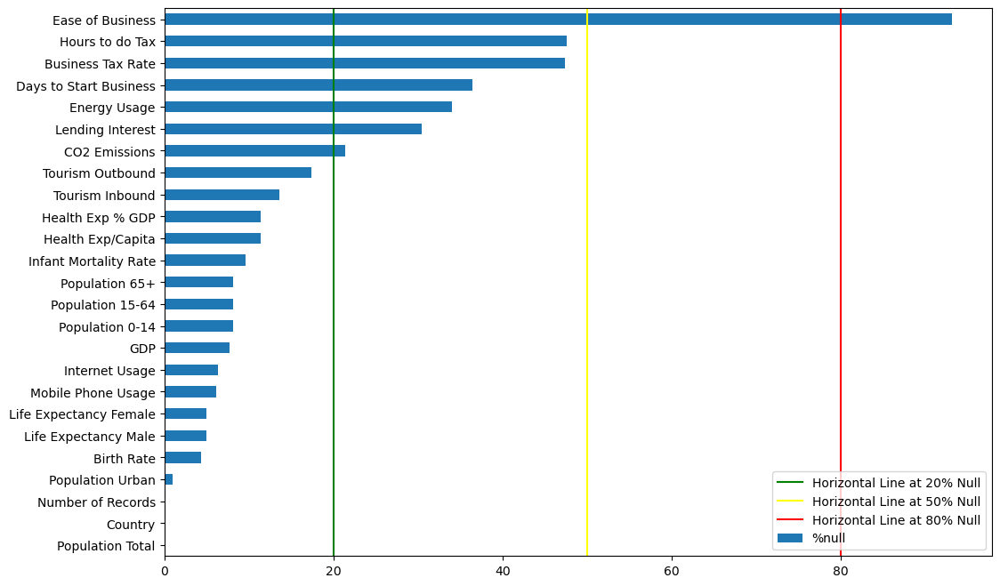

In [ ]:
nulls['%null'].sort_values(ascending=True).plot(kind='barh')
plt.axvline(20,color='green',label='Horizontal Line at 20% Null')
plt.axvline(50,color='yellow',label='Horizontal Line at 50% Null')
plt.axvline(80,color='red',label='Horizontal Line at 80% Null')
plt.legend()

### 1. NULL < 20%

In [ ]:
from sklearn.impute import KNNImputer

In [ ]:
nulls[(nulls['%null']<20) & (nulls['%null']!=0)].index

Index(['Birth Rate', 'GDP', 'Health Exp % GDP', 'Health Exp/Capita',
       'Infant Mortality Rate', 'Internet Usage', 'Life Expectancy Female',
       'Life Expectancy Male', 'Mobile Phone Usage', 'Population 0-14',
       'Population 15-64', 'Population 65+', 'Population Urban',
       'Tourism Inbound', 'Tourism Outbound'],
      dtype='object')

In [ ]:
def if_any_outlier(df,col)->bool:
    iqr = df[col].quantile(0.75) - df[col].quantile(0.25)
    ub = df[col].quantile(0.75) + (iqr*1.5)
    lb = df[col].quantile(0.25) - (iqr*1.5)
    outlier = np.any(df[(df[col]>ub) | (df[col]<lb)])
    return outlier

In [ ]:
for i in nulls[(nulls['%null']<20) & (nulls['%null']!=0)].index:
    out_stat = if_any_outlier(df,i) # check for outlier
    skew = df[i].skew() # check skewness
    if not out_stat and skew < 1.0: # use knn imputer if not highly skwed and doesnot have outlier
        kni = KNNImputer(n_neighbors=8)
        df[i] = kni.fit_transform(df[[i]])
    elif out_stat: # fill with median since distribution has outlier
        df[i].fillna(df[i].median(),inplace=True)

### 2. 20% < NULL < 50%

In [ ]:
nulls[(nulls['%null']<50) & (nulls['%null']>=20)].index

Index(['Business Tax Rate', 'CO2 Emissions', 'Days to Start Business',
       'Energy Usage', 'Hours to do Tax', 'Lending Interest'],
      dtype='object')

*Use the same strategy as above*

In [ ]:
for i in nulls[(nulls['%null']<50) & (nulls['%null']>=20)].index:
    out_stat = if_any_outlier(df,i) # check for outlier
    skew = df[i].skew() # check skewness
    if not out_stat and skew < 1.0: # use knn imputer if not highly skwed and doesnot have outlier
        kni = KNNImputer(n_neighbors=8)
        df[i] = kni.fit_transform(df[[i]])
    elif out_stat: # fill with median since distribution has outlier
        df[i].fillna(df[i].median(),inplace=True)

### 3. 80+% NULL

In [ ]:
nulls[nulls['%null']>80].index

Index(['Ease of Business'], dtype='object')

In [ ]:
temp_df = df[df['Ease of Business'].notna()] # dataframe  with no missing values for ease of business column

In [ ]:
df['Ease of Business'].unique() # looks like regression task

array([ nan, 151., 178., 175.,  65., 154., 157., 162., 187., 189., 160.,
       183., 186., 173., 172., 127., 164., 185., 124., 169., 148.,  62.,
       179., 181., 122., 139., 149., 188., 144., 161., 153., 171.,  20.,
        95., 142.,  94., 174., 138.,  54., 166., 176.,  77., 137.,  41.,
       184., 143., 120., 136., 159.,  49., 126.,  90., 168., 170.,  40.,
        71., 132., 146.,  79., 135.,  99.,   9.,   2., 131., 116.,  23.,
        53.,   6.,  70., 163.,   8.,  81.,  80., 182., 103., 106., 133.,
         1.,  83., 141.,  18., 167., 156.,  98.,  82.,  28.,  64.,  32.,
       130.,  57.,  88.,  38.,  68.,   5.,  21.,  12.,  35.,  19.,  89.,
        52.,  13.,  15.,  67.,  96.,  24.,  25.,  56.,  36., 100.,  86.,
        50.,  30.,   7.,  48.,  29.,  73., 111.,  74.,  87.,  43.,  31.,
        46.,  14.,  27.,  72., 140.,  11.,  47., 152., 155.,  33., 119.,
       101., 105.,  44.,  45.,  22., 147.,  26., 129.,  10.,  58., 117.,
       110., 150.,   3., 108.,  55.,  92.,  60.,  7

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
X = temp_df.drop(['Ease of Business','Country'],axis=1)
Y = temp_df['Ease of Business']

In [ ]:
rf = GradientBoostingRegressor().fit(X,Y)

In [ ]:
temp_df = df[df['Ease of Business'].isna()]
temp_df = temp_df.drop(['Ease of Business','Country'],axis=1)
pred = rf.predict(temp_df)
pred = [round(x) for x in pred]

In [ ]:
for idx,val in zip(df[df['Ease of Business'].isna()].index,pred):
    df.loc[idx,'Ease of Business'] = val

In [ ]:
df.isna().any()

Birth Rate                False
Business Tax Rate         False
CO2 Emissions             False
Country                   False
Days to Start Business    False
Ease of Business          False
Energy Usage              False
GDP                       False
Health Exp % GDP          False
Health Exp/Capita         False
Hours to do Tax           False
Infant Mortality Rate     False
Internet Usage            False
Lending Interest          False
Life Expectancy Female    False
Life Expectancy Male      False
Mobile Phone Usage        False
Number of Records         False
Population 0-14           False
Population 15-64          False
Population 65+            False
Population Total          False
Population Urban          False
Tourism Inbound           False
Tourism Outbound          False
dtype: bool

*No Null Values*

# 3. EDA

In [ ]:
df = pd.read_csv('./Cleaned.csv')
df.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,41.0,87931.0,Algeria,26.0,138.0,26998.0,5.479006e+10,0.035,60.0,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,102000000.0,193000000.0
1,0.050,41.0,9542.0,Angola,26.0,168.0,7499.0,9.129595e+09,0.034,22.0,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,34000000.0,146000000.0
2,0.043,41.0,1617.0,Benin,26.0,170.0,1983.0,2.359122e+09,0.043,15.0,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,77000000.0,50000000.0
3,0.027,41.0,4276.0,Botswana,26.0,143.0,1836.0,5.788312e+09,0.047,152.0,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,227000000.0,209000000.0
4,0.046,41.0,1041.0,Burkina Faso,26.0,171.0,14338.0,2.610959e+09,0.051,12.0,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,23000000.0,30000000.0


In [ ]:
country = df['Country']
df.drop('Country',axis=1,inplace=True)

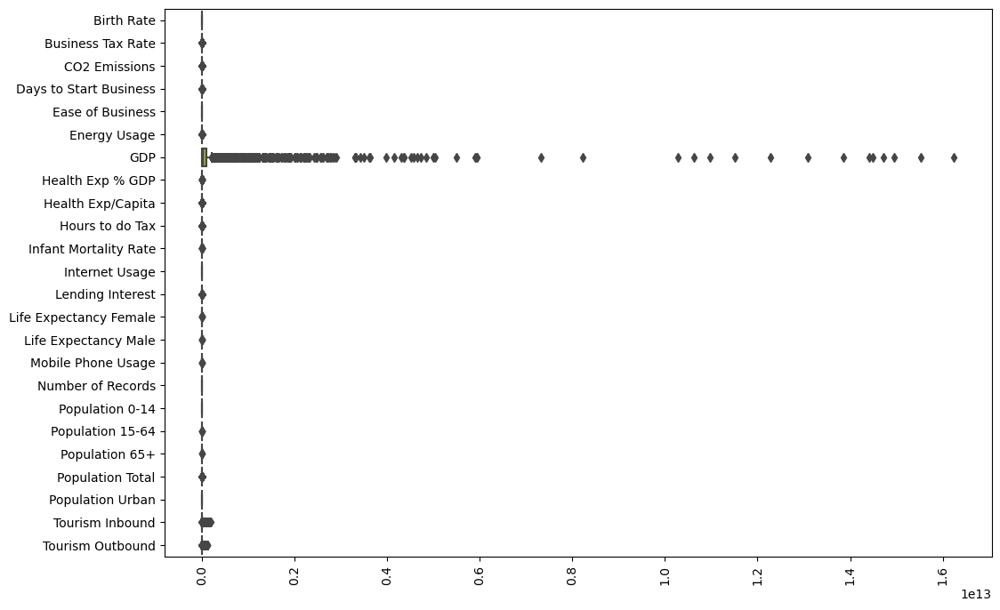

In [ ]:
sns.boxplot(df,orient='h')
plt.xticks(rotation=90)
plt.show()

*We can observe the dataset has outliers*

In [ ]:
cols_with_outlier = [x for x in df.columns if if_any_outlier(df,x)]

In [ ]:
def get_ub_db(df,col)->(float,float):
    iqr = df[col].quantile(0.75) - df[col].quantile(0.25)
    ub = df[col].quantile(0.75) + (iqr*1.5)
    lb = df[col].quantile(0.25) - (iqr*1.5)
    return (ub,lb)

In [ ]:
for i in cols_with_outlier:
    ub,lb = get_ub_db(df,i)
    for j in df[df[i]>ub].index:
        df.loc[j,i] = ub
    for k in df[df[i]<lb].index:
        df.loc[k,i] = lb

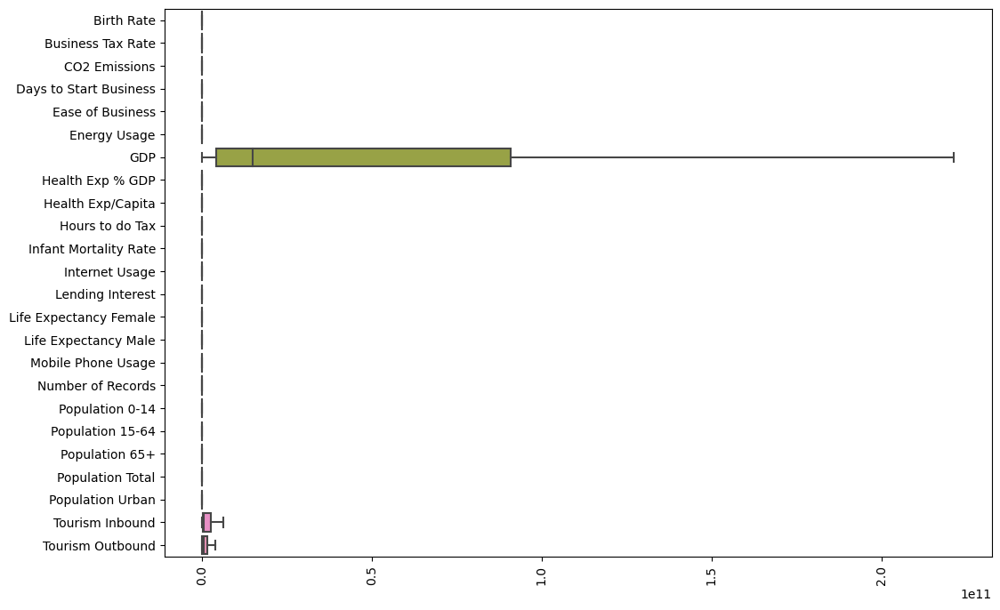

In [ ]:
sns.boxplot(df,orient='h')
plt.xticks(rotation=90)
plt.show()

*Now the dataset doesnot have any outliers*

## T-SNE

*Using T-SNE to Reduce Dimensionality of the data for visualization*

In [ ]:
from sklearn.manifold import TSNE
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df)

In [ ]:
tsne = TSNE(n_components=3)
tsne_df = tsne.fit_transform(scaled_df)

In [ ]:
tsne_df = pd.DataFrame(tsne_df,columns=['Component 1','Component 2','Component 3'])
tsne_df

,Component 1,Component 2,Component 3
0,0.467971,12.739212,-0.723831
1,-16.829247,11.980778,7.186511
2,-17.421688,7.309286,1.460256
3,-14.796288,5.674837,-2.700474
4,-21.346840,8.427346,2.892788
...,...,...,...
2699,4.817835,-11.966053,-10.821238
2700,26.822132,6.569660,2.136786
2701,16.546341,-10.137915,4.318278
2702,4.540457,7.058074,4.068359


In [ ]:
fig = px.scatter_3d(tsne_df, x='Component 1', y='Component 2', z='Component 3')
fig.update_layout(scene=dict(xaxis_title='Component 1', yaxis_title='Component 2', zaxis_title='Component 3'))
fig.show()

## PCA

*Using PCA to Reduce Dimensionality of the data and also we can use this for clustering*

In [ ]:
from sklearn.decomposition import PCA

*We need to scale data because PCA uses distance calculation to find ideal axis for the decomposed data*

In [ ]:
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df)

In [ ]:
pca = PCA()
pca.fit(scaled_df)

PCA()

In [ ]:
explained_variance = pca.explained_variance_ratio_

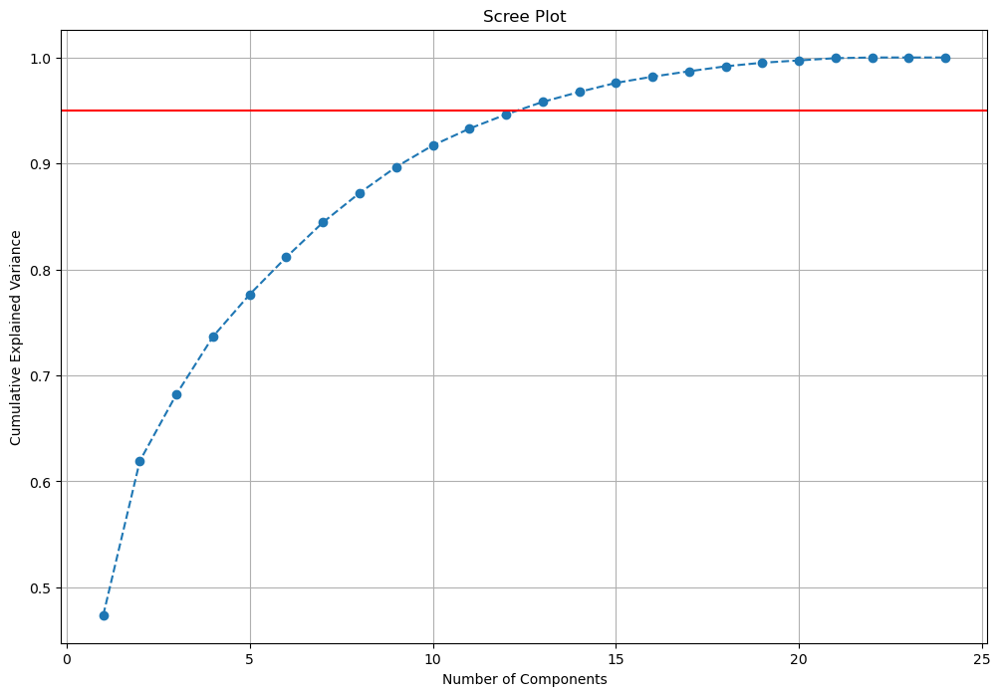

In [ ]:
cumulative_variance = explained_variance.cumsum()
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.axhline(0.95,color='red')
plt.title('Scree Plot')
plt.grid()
plt.show()

*Red Line Shows 95% of variance threshold*

*n_components = 13 captures almost 95% of the original dataset variance*

In [ ]:
pca = PCA(n_components=13)
pca_df = pca.fit_transform(scaled_df)

In [ ]:
pca_df = pd.DataFrame(pca_df,columns=[f"Component {i+1}" for i in range(13)])
pca_df.head()

,Component 1,Component 2,Component 3,Component 4,Component 5,Component 6,Component 7,Component 8,Component 9,Component 10,Component 11,Component 12,Component 13
0,-0.997888,1.335032,-1.553526,1.472369,0.209645,-0.981012,-0.704564,-0.120869,-0.916780,-0.477263,-0.753539,-0.231335,0.398905
1,-6.118700,1.348678,1.479257,0.164123,-0.215462,-0.414993,0.608536,0.995962,0.877262,-0.873880,0.634264,-0.867756,0.288005
2,-4.839376,0.277834,0.999407,0.389599,-0.839394,-0.064355,-0.137113,-0.124711,-0.558319,-0.686999,0.660910,-0.202462,0.173800
3,-3.568205,-0.366635,0.344975,0.148954,-0.147934,-0.206877,0.065834,0.407834,0.235855,-1.434660,0.578282,-0.015869,-0.091424
4,-5.295743,1.024740,1.586983,0.364647,-0.676648,-0.102519,-0.106717,-0.729068,-0.249960,-0.607467,0.188614,-0.350180,0.066323


In [ ]:
fig = px.scatter_3d(pca_df, x='Component 1', y='Component 2', z='Component 3')
fig.update_layout(scene=dict(xaxis_title='Component 1', yaxis_title='Component 2', zaxis_title='Component 3'))
fig.show()

In [ ]:
fig = px.scatter_3d(pca_df, x='Component 5', y='Component 6', z='Component 7')
fig.update_layout(scene=dict(xaxis_title='Component 5', yaxis_title='Component 6', zaxis_title='Component 7'))
fig.show()

In [ ]:
fig = px.scatter_3d(pca_df, x='Component 8', y='Component 9', z='Component 10')
fig.update_layout(scene=dict(xaxis_title='Component 8', yaxis_title='Component 9', zaxis_title='Component 10'))
fig.show()

In [ ]:
fig = px.scatter_3d(pca_df, x='Component 11', y='Component 12', z='Component 13')
fig.update_layout(scene=dict(xaxis_title='Component 11', yaxis_title='Component 12', zaxis_title='Component 13'))
fig.show()

In [ ]:
from scipy.cluster import hierarchy

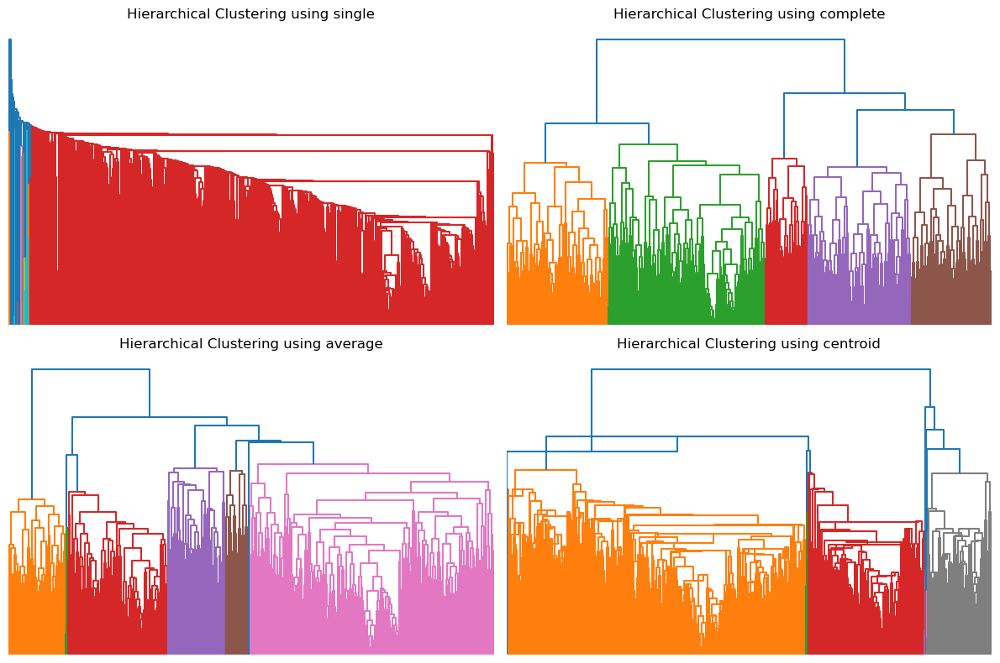

In [ ]:
for i,method in enumerate(['single','complete','average','centroid']):
    plt.subplot(2,2,i+1)
    lk = hierarchy.linkage(pca_df,method=method)
    dendo = hierarchy.dendrogram(lk)
    plt.title(f"Hierarchical Clustering using {method}")
    plt.axis('off')
    plt.tight_layout()

*As observed from the dendogram the ideal number of clusters we can observer is 5*

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
hc = AgglomerativeClustering(n_clusters=5)
y = hc.fit_predict(scaled_df)

In [ ]:
df['Country'] = country
df['Cluster'] = y

In [ ]:
cluster_ctr = df.groupby('Cluster')['Country']

In [ ]:
from wordcloud import WordCloud
import re

In [ ]:
def plot_cluster(cluster_group,num_pos = 0):
    text = [re.sub(r'\s+', '', x) for x in set(cluster_group.get_group(num_pos))]
    text = ' '.join(text)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Cluster {num_pos}')
    plt.plot()

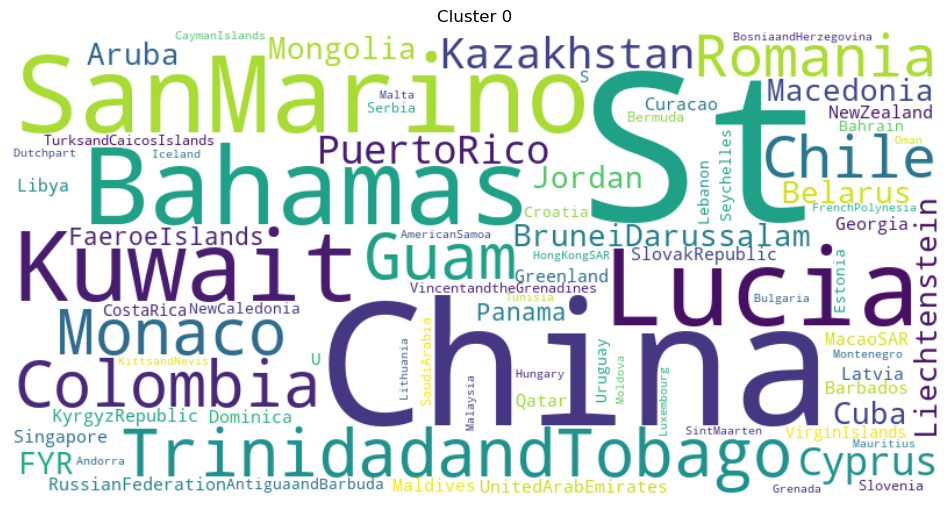

In [ ]:
plot_cluster(cluster_ctr,0)

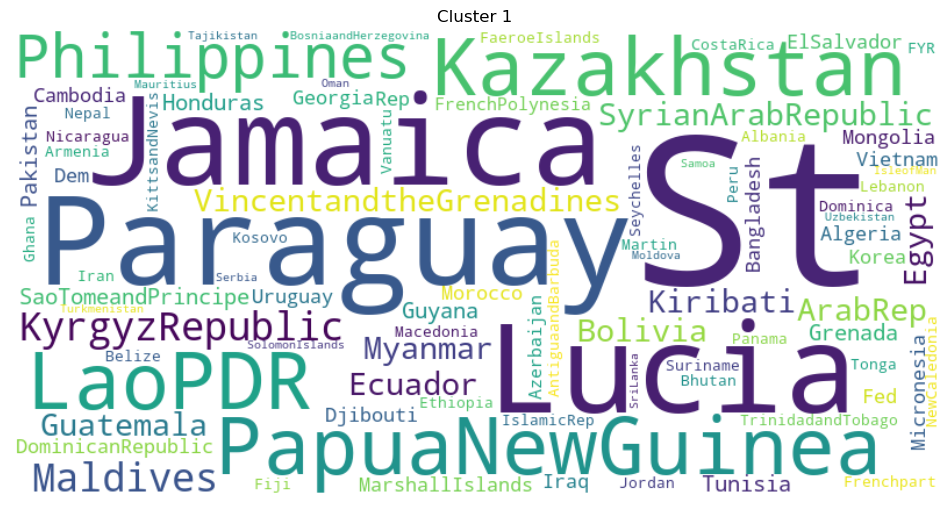

In [ ]:
plot_cluster(cluster_ctr,1)

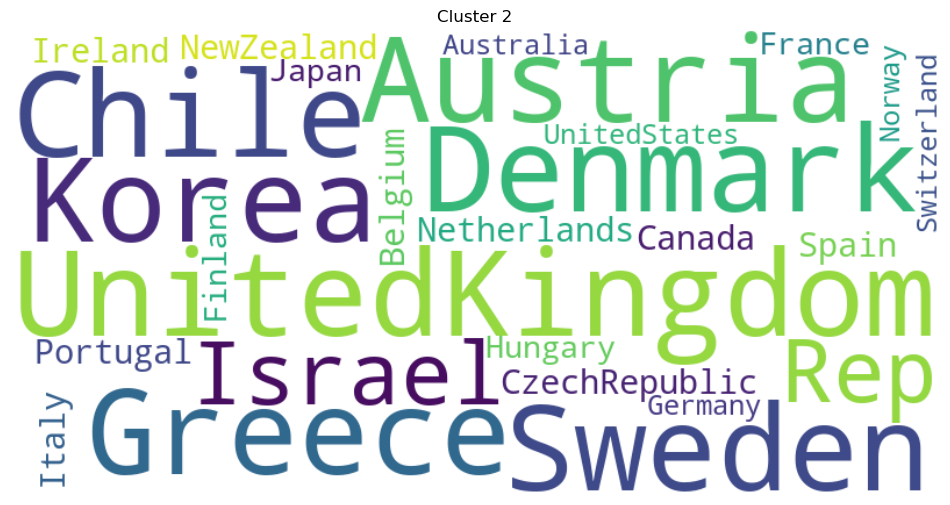

In [ ]:
plot_cluster(cluster_ctr,2)

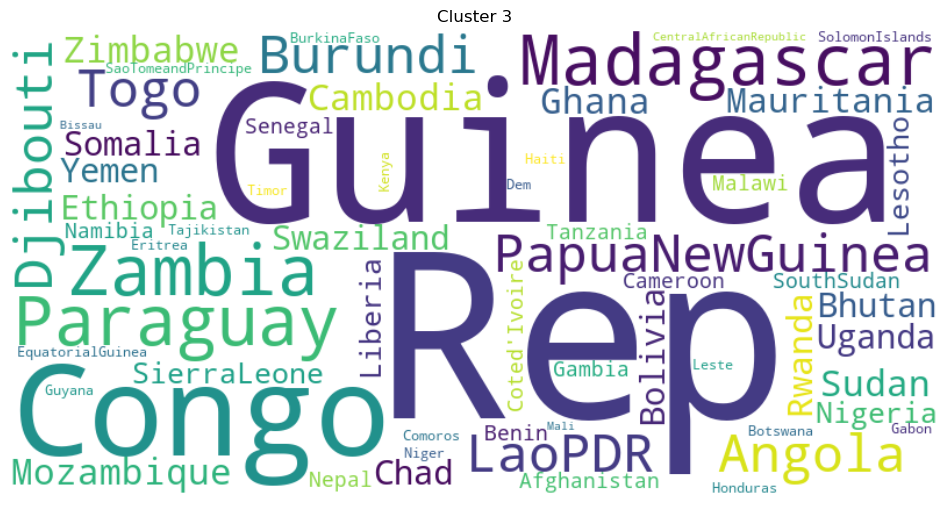

In [ ]:
plot_cluster(cluster_ctr,3)

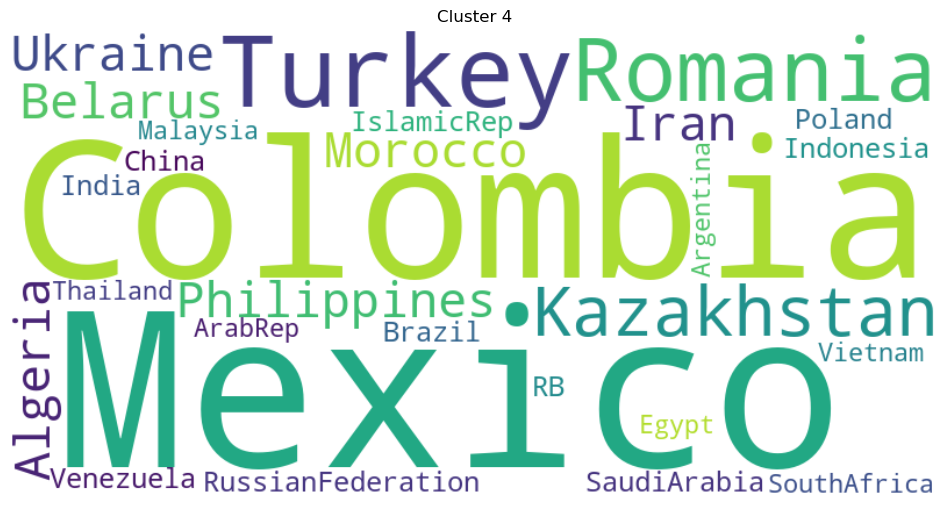

In [ ]:
plot_cluster(cluster_ctr,4)

### Multivariate analysis of Cluster

In [ ]:
# create cluster profile for mean of features in the cluster
cluster_profiles = df.drop('Country',axis=1).groupby('Cluster').mean()

In [ ]:
def plot_cluster_profile(cluster_profiles,columns_to_plot):
    # Create an array of cluster indices for positioning the bars
    cluster_indices = np.arange(cluster_profiles.shape[0])
    n_cluster = np.max(df['Cluster'])
    # Set the width of each bar
    bar_width = 0.15
    xlpos = np.arange(0,np.max(n_cluster)+1,1) + (bar_width/len(columns_to_plot))
    # Plot both columns side by side
    plt.figure(figsize=(10, 5))
    for i, column in enumerate(columns_to_plot):
        plt.bar(cluster_indices + i * bar_width, cluster_profiles[column], bar_width, label=column)

    plt.xlabel('Cluster')
    plt.ylabel('Mean')
    plt.title(f'Cluster Profiles : {",".join(columns_to_plot)}')
    if len(columns_to_plot)==1:
        plt.xticks(cluster_indices)
    else:
        plt.xticks(xlpos,cluster_indices)
    plt.legend()
    plt.show()



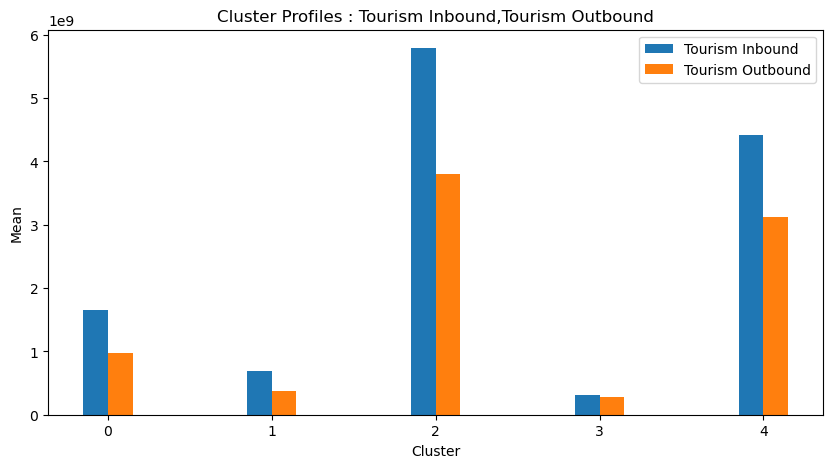

In [ ]:
plot_cluster_profile(cluster_profiles,['Tourism Inbound', 'Tourism Outbound'])

* *Tourism Inbound and outbound for cluster 2 which has countries like `USA , UK , Ireland , Australia`, etc has `highest value`.*
* *Tourism Inbound and outbound for cluster 3 which has countries like `Kenya , Uganda , haiti , paraguay`, etc has `lowest value`.*

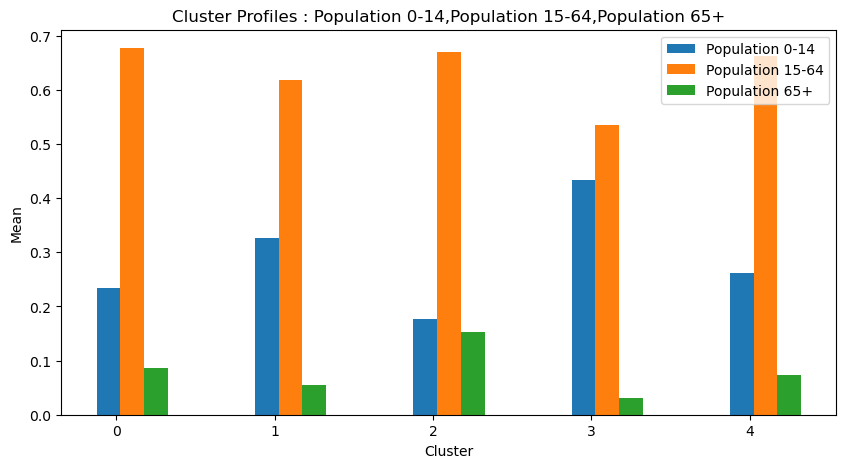

In [ ]:
plot_cluster_profile(cluster_profiles,['Population 0-14', 'Population 15-64','Population 65+'])

* *Population trend for all cluster shows quite similar propotion.*
    * *each cluster has `highest value for population 15-64.`*
    * *`population 0-15 has the second highest value.`*
    * *then finally `lowest value for population 65+.`*


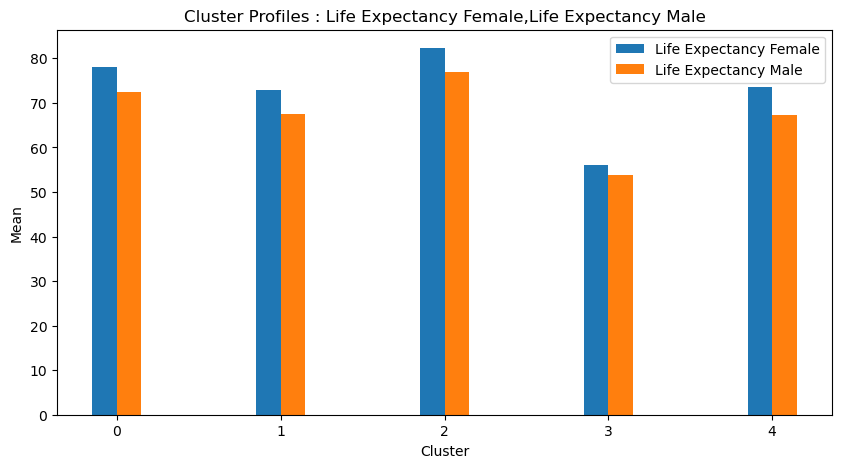

In [ ]:
plot_cluster_profile(cluster_profiles,['Life Expectancy Female', 'Life Expectancy Male'])

* *Life Expectancy for `both gender shows higher mean , which means men and women live longer`.*
* *Women tends to live longer than men.*
* *We can also see huge change in mean between cluster 2 and cluster 3 , previously we saw that cluster 2 has countries like usa and uk and cluster 3 has countries like uganda and nigeria. `cluster 3 has much lower life expectancy for both gender.`*

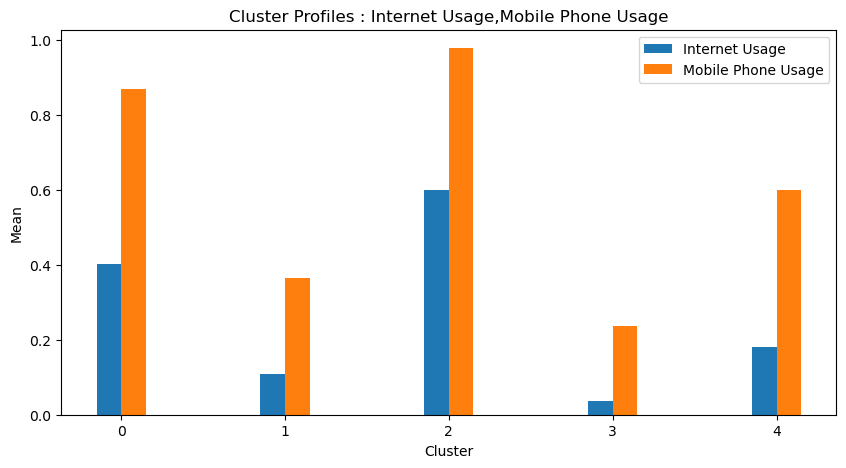

In [ ]:
plot_cluster_profile(cluster_profiles,['Internet Usage', 'Mobile Phone Usage'])

* *Mobile usage has higher mean than internet usage*
    * *Cluster 2 has `some developed countries` and therefore we see `high mobile and internet usage`.*
    * *Cluster 3 has `some third world countries` and therefore we see `very low mobile and internet usage.`*

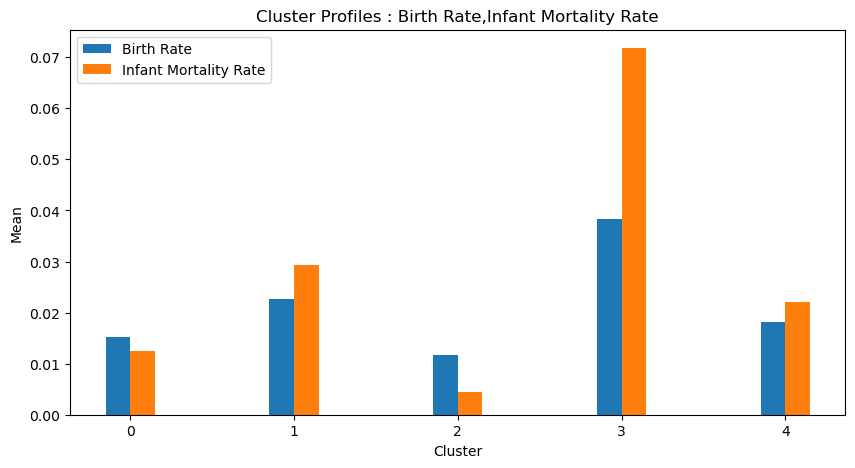

In [ ]:
plot_cluster_profile(cluster_profiles,['Birth Rate', 'Infant Mortality Rate'])

* *Cluster 3 shows relatively `very high mean for infant mortality rate` this could mean that 3rd world countries have `bad maternal care`.*
* *Cluster 3 also shows relatively `very high mean for birth rate` this could mean that `population might not be under control`.*
* *Cluster 2 shows `lowest mean for both infant mortality rate and birth rate` this could mean the countries in cluster 3 have better `maternal care and have population under control`.*

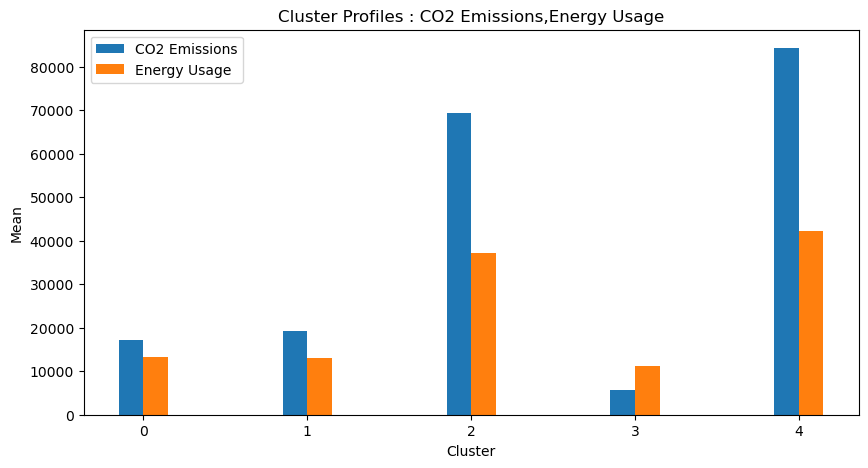

In [ ]:
plot_cluster_profile(cluster_profiles,['CO2 Emissions', 'Energy Usage'])

* *Cluster 3 has lowest co2 emissions and energy usage which could mean that there are very less industries and energy might not be available to huge portion of population.*
* *Cluster 2 has much higher co2 emissions and energy usage as expected from developed countries.*
* *Cluster 4 has highest co2 emissions and energy usage, this cluster has countries like saudi arabia , india , iran which have much more industries and population resulting in high co2 emission.*

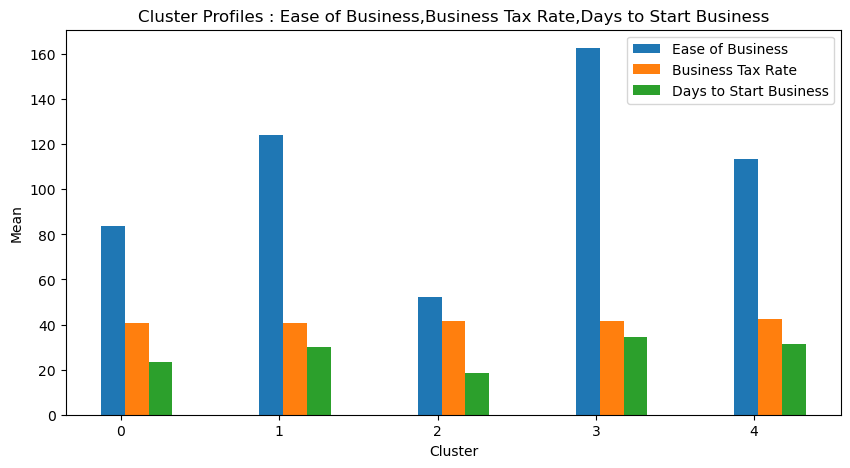

In [ ]:
plot_cluster_profile(cluster_profiles,['Ease of Business','Business Tax Rate','Days to Start Business'])

*  *Business rate is equal for all cluster.*
*  *Ease of business is highest and days to start business is lowest for cluster 3 this could also mean they dont have up to the mark protocols to ensure that business can be trusted.*
*  *Ease of business is lowest and days to start business is lowest for cluster 2 this could also mean they do have up to the mark protocols to ensure that business can be trusted and might also have controlled market.*

### Univariate analysis of cluster

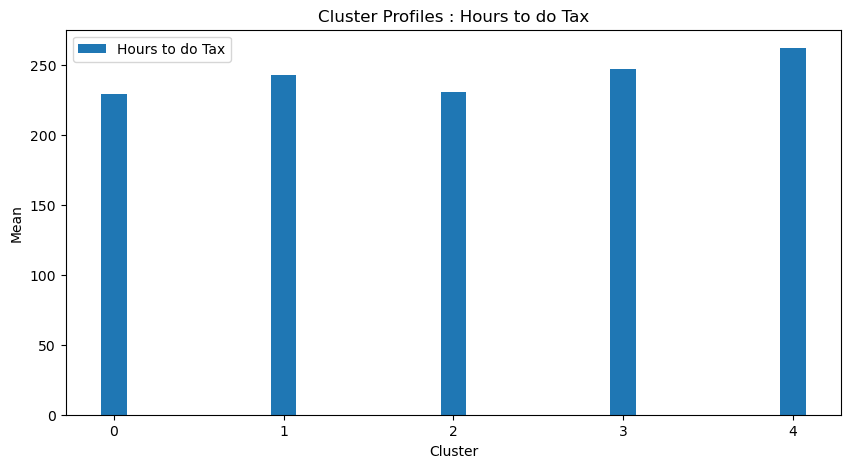

In [ ]:
plot_cluster_profile(cluster_profiles,['Hours to do Tax'])

* *Hours to do tax doesn't varry by much for all clusters.*

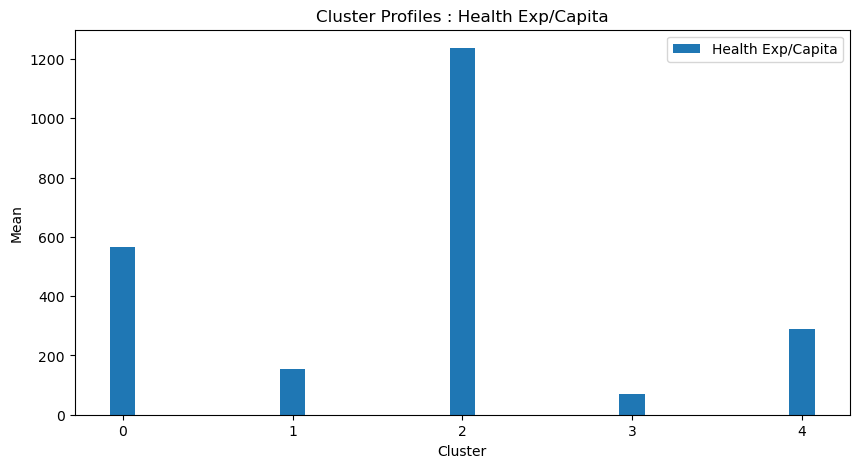

In [ ]:
plot_cluster_profile(cluster_profiles,['Health Exp/Capita'])

* *Cluster 2 has highest Health Exp/capita which means developed nations invest more in human health and wellfare.*
* *Cluster 3 has lowest Health Exp/capita which means developed nations invest least amount in human health and wellfare.*

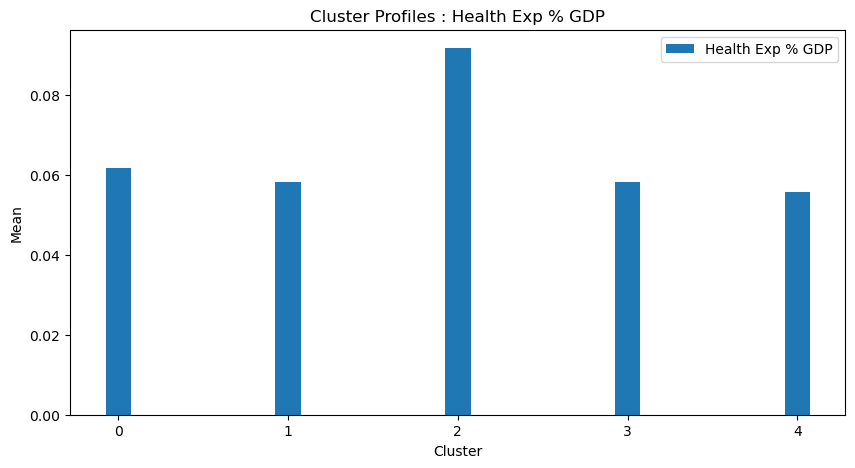

In [ ]:
plot_cluster_profile(cluster_profiles,['Health Exp % GDP'])

* *Cluster 2 shows developed countries tends to invest more % of GDP on human health and wellfare than rest of the countries.*
* *Cluster 3 shows 3rd world countries tends to invest appx. equal % of GDP on human health and wellfare. as rest of the countries.*
* *Cluster 3 shows that its health capita aquires fairly similar % of GDP like other clusters but thats only due to the percent scale the same % value might represent different value for other clusters.*

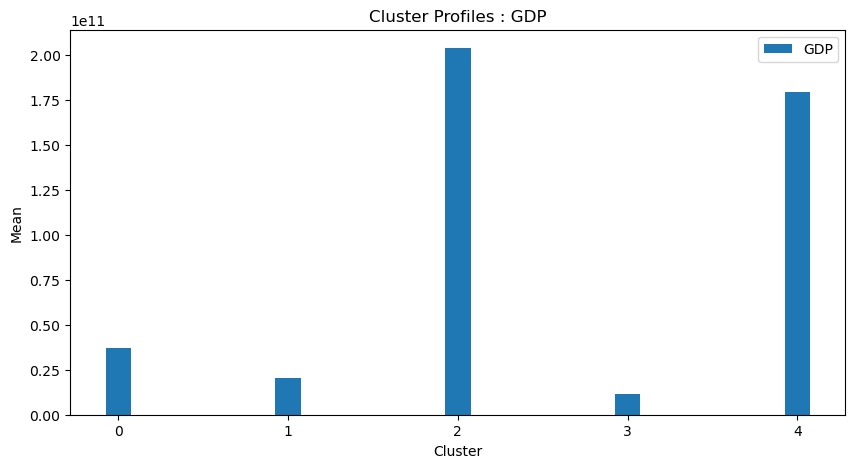

In [ ]:
plot_cluster_profile(cluster_profiles,['GDP'])

* *Cluster 2 shows developed countries have higher GDP than others.*
* *Cluster 3 shows 3rd world countries have lowest GDP.*
* *Cluster 4 shows higher GDP than other's except cluster 2 as cluster 4 countries have much more industries , higher tourism and high population.*

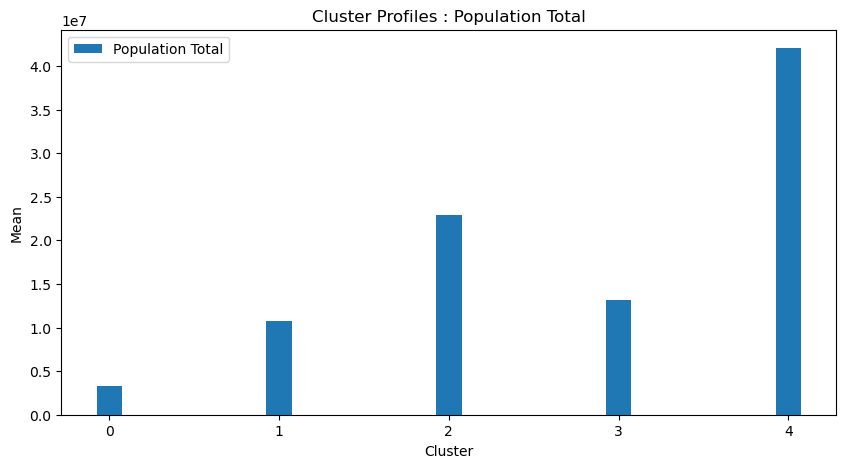

In [ ]:
plot_cluster_profile(cluster_profiles,['Population Total'])

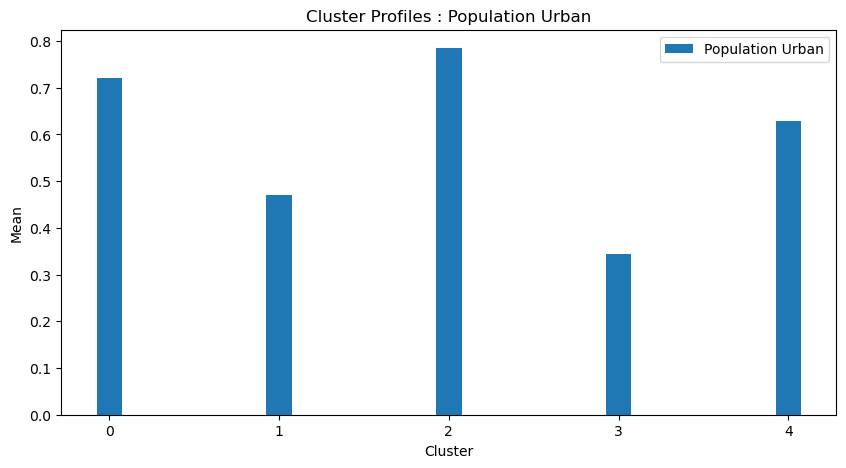

In [ ]:
plot_cluster_profile(cluster_profiles,['Population Urban'])

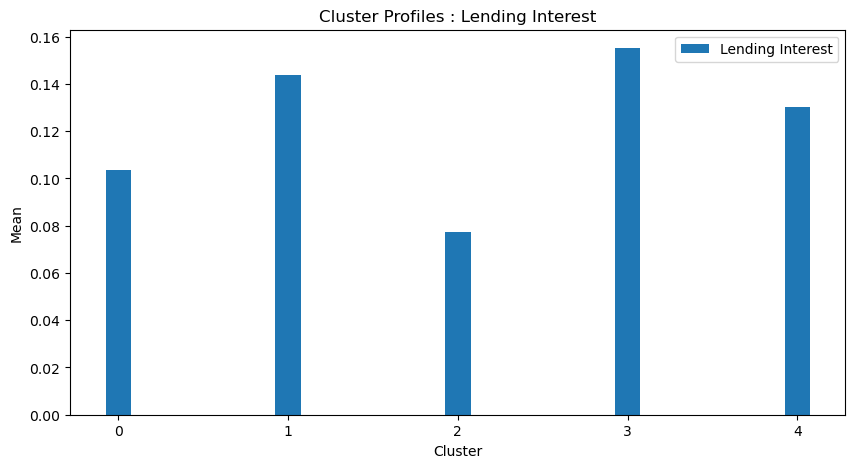

In [ ]:
plot_cluster_profile(cluster_profiles,['Lending Interest'])

* *Developed nations have lowest lending interest as shown by cluster 2 while 3rd world nations have highest lending interest as shown by cluster 3.*

# Clustering

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

In [ ]:
df = pd.read_csv('./Analysis Data.csv')
df.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,...,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound,Country
0,0.020,41.0,87931.0,26.0,138.0,26998.0,5.479006e+10,0.035,60.0,239.0,...,0.0,1,0.342,0.619,0.039,31719449.0,0.599,102000000.0,193000000.0,Algeria
1,0.050,41.0,9542.0,26.0,168.0,7499.0,9.129595e+09,0.034,22.0,239.0,...,0.0,1,0.476,0.499,0.025,13924930.0,0.324,34000000.0,146000000.0,Angola
2,0.043,41.0,1617.0,26.0,170.0,1983.0,2.359122e+09,0.043,15.0,239.0,...,0.0,1,0.454,0.517,0.029,6949366.0,0.383,77000000.0,50000000.0,Benin
3,0.027,41.0,4276.0,26.0,143.0,1836.0,5.788312e+09,0.047,152.0,239.0,...,0.1,1,0.383,0.587,0.029,1755375.0,0.532,227000000.0,209000000.0,Botswana
4,0.046,41.0,1041.0,26.0,171.0,14338.0,2.610959e+09,0.051,12.0,239.0,...,0.0,1,0.468,0.505,0.028,11607944.0,0.178,23000000.0,30000000.0,Burkina Faso


In [ ]:
std = StandardScaler()
scaled_df = std.fit_transform(df.drop(['Country'],axis=1))

In [ ]:
def plot_cluster_profile(cluster_profiles,columns_to_plot,df,cluster_col,ax):
    # Create an array of cluster indices for positioning the bars
    cluster_indices = np.arange(cluster_profiles.shape[0])
    n_cluster = np.max(df[cluster_col])
    # Set the width of each bar
    bar_width = 0.15
    xlpos = np.arange(0,np.max(n_cluster)+1,1) + (bar_width/len(columns_to_plot))

    # Plot both columns side by side

    for i, column in enumerate(columns_to_plot):
        ax.bar(cluster_indices + i * bar_width, cluster_profiles[column], bar_width, label=column)

    ax.set_xlabel('Cluster')
    ax.set_ylabel('Mean')
    if len(columns_to_plot)==1:
        ax.set_xticks(cluster_indices)
    else:
        ax.set_xticks(xlpos,cluster_indices)
    ax.legend()




In [ ]:
def plot_cluster_profile_neg(cluster_profiles,columns_to_plot,df,cluster_col,ax):
    cluster_indices = np.arange(0,cluster_profiles.shape[0])
    lbl = np.arange(-1,cluster_profiles.shape[0]-1)
    n_cluster = np.max(df[cluster_col])
        # Set the width of each bar
    bar_width = 0.15
    xlpos = np.arange(0,np.max(n_cluster)+2,1) + (bar_width/len(columns_to_plot))
        # Plot both columns side by side

    for i, column in enumerate(columns_to_plot):
        ax.bar(cluster_indices + i * bar_width, cluster_profiles[column], bar_width, label=column)

    ax.set_xlabel('Cluster')
    ax.set_ylabel('Mean')

    if len(columns_to_plot)==1:
        p = np.arange(0,len(lbl))
        ax.set_xticks(p,lbl)
    else:
        ax.set_xticks(xlpos,lbl)
    ax.legend()


## 1.Hierarchical Clustering

In [ ]:
from scipy.cluster import hierarchy
from sklearn.cluster import AgglomerativeClustering

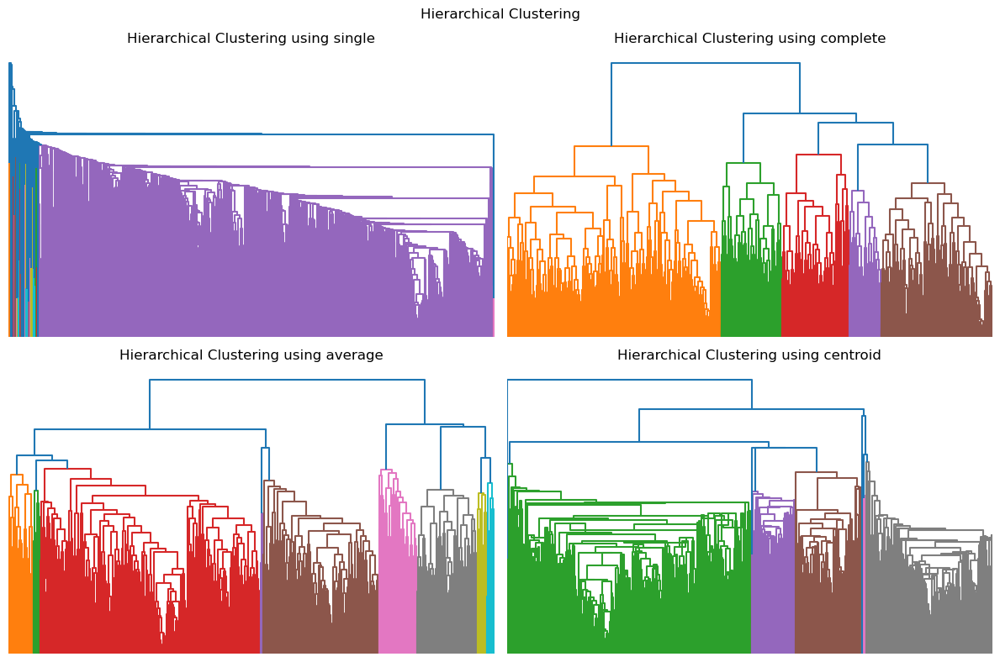

In [ ]:
for i,method in enumerate(['single','complete','average','centroid']):
    plt.subplot(2,2,i+1)
    lk = hierarchy.linkage(scaled_df,method=method)
    dendo = hierarchy.dendrogram(lk)
    plt.title(f"Hierarchical Clustering using {method}")
    plt.axis('off')
plt.suptitle('Hierarchical Clustering')
plt.tight_layout()
plt.show()

*Ideal number of cluster observed is 5.*

In [ ]:
alg = AgglomerativeClustering(n_clusters=5)
clst = alg.fit_predict(scaled_df)

In [ ]:
df['Hierarchical Cluster'] = clst

In [ ]:
cluster_profiles_hc = df.drop('Country',axis=1).groupby('Hierarchical Cluster').mean()

## 2. KMeans Clustering

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
kmc = KMeans(n_init='auto')
kmc_clt = kmc.fit_predict(scaled_df)

In [ ]:
silhouette_score(scaled_df,kmc_clt)

0.13978837169340202

In [ ]:
# optimize kmeans model
wcss = []

for i in range(1,20): # create n clusters itteratively ranging 1 to 20
    km = KMeans(n_clusters=i)
    km.fit_predict(scaled_df)
    wcss.append(km.inertia_) # append the squared distance from closest cluster

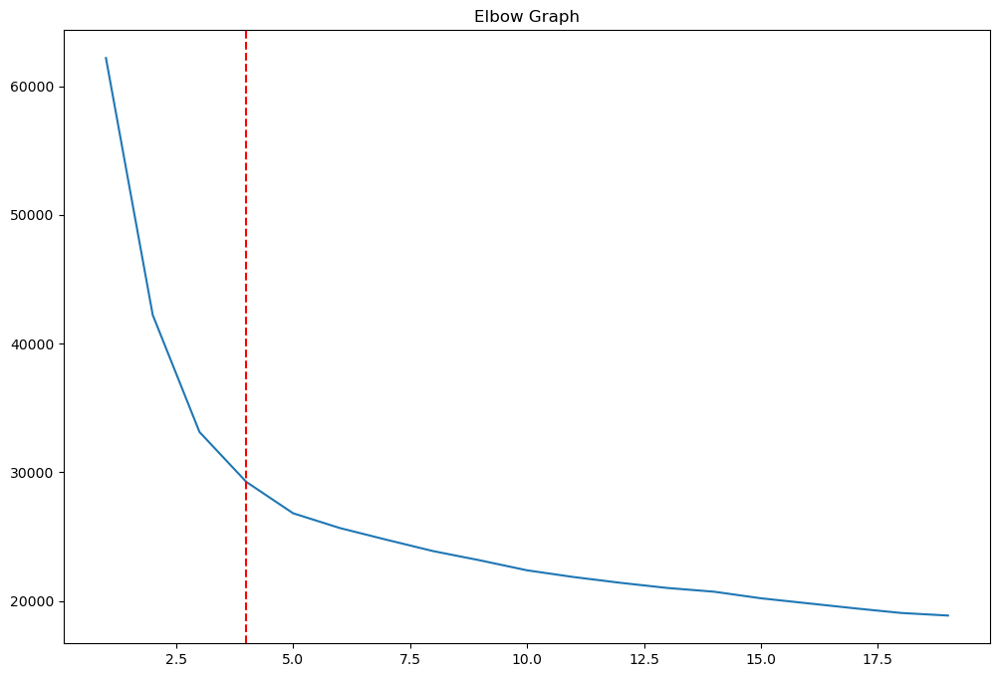

In [ ]:
plt.plot(range(1,20),wcss)
plt.title('Elbow Graph')
plt.axvline(4,linestyle='--',c='r')
plt.show()

for N_cluster = 4 we get ideal score

In [ ]:
kmc = KMeans(n_clusters=4)
kmc_clt = kmc.fit_predict(scaled_df)

In [ ]:
silhouette_score(scaled_df,kmc_clt)

0.2706740975165511

In [ ]:
df['KMeans Cluster'] = kmc_clt

In [ ]:
cluster_profiles_km = df.drop('Country',axis=1).groupby('KMeans Cluster').mean()

## 3. DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN

In [ ]:
dbs = DBSCAN(eps=3.5,min_samples=20)
db_clust = dbs.fit_predict(scaled_df)
silhouette_score(scaled_df,db_clust)

0.18671690722766632

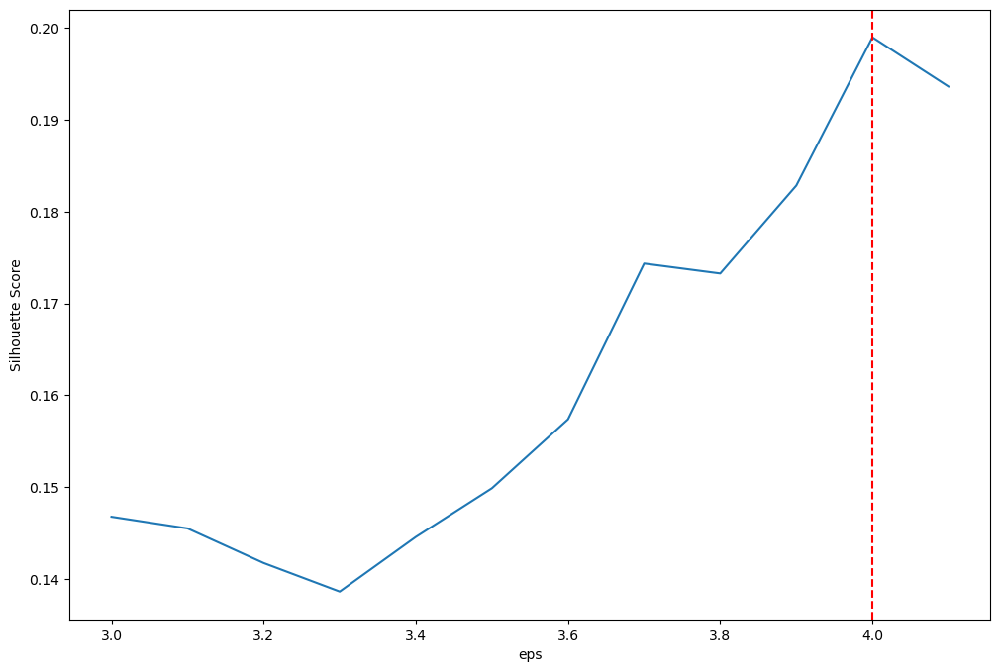

In [ ]:
#optimize DBSCAN
i = 3.0
scores = []
epss = []
while i < 4.2:
    dbs = DBSCAN(eps=i,min_samples=48)
    db_clust = dbs.fit_predict(scaled_df)
    scores.append(silhouette_score(scaled_df,db_clust))
    epss.append(i)
    i += 0.1
plt.plot(epss,scores)
plt.ylabel('Silhouette Score')
plt.xlabel('eps')
plt.axvline(4.0,color='red',linestyle='--')
plt.show()

In [ ]:
dbs = DBSCAN(eps=4.0,min_samples=48)
db_clust = dbs.fit_predict(scaled_df)
silhouette_score(scaled_df,db_clust)

0.19897146398318

In [ ]:
df['DBSCAN Cluster'] = db_clust

In [ ]:
cluster_profiles_dbscan = df.drop('Country',axis=1).groupby('DBSCAN Cluster').mean()

## 4. HDBSCAN

In [ ]:
import hdbscan

In [ ]:
hscan = hdbscan.HDBSCAN(min_cluster_size=4,min_samples=48)
hsc_clust = hscan.fit_predict(scaled_df)
silhouette_score(scaled_df,hsc_clust)

0.03537573009769592

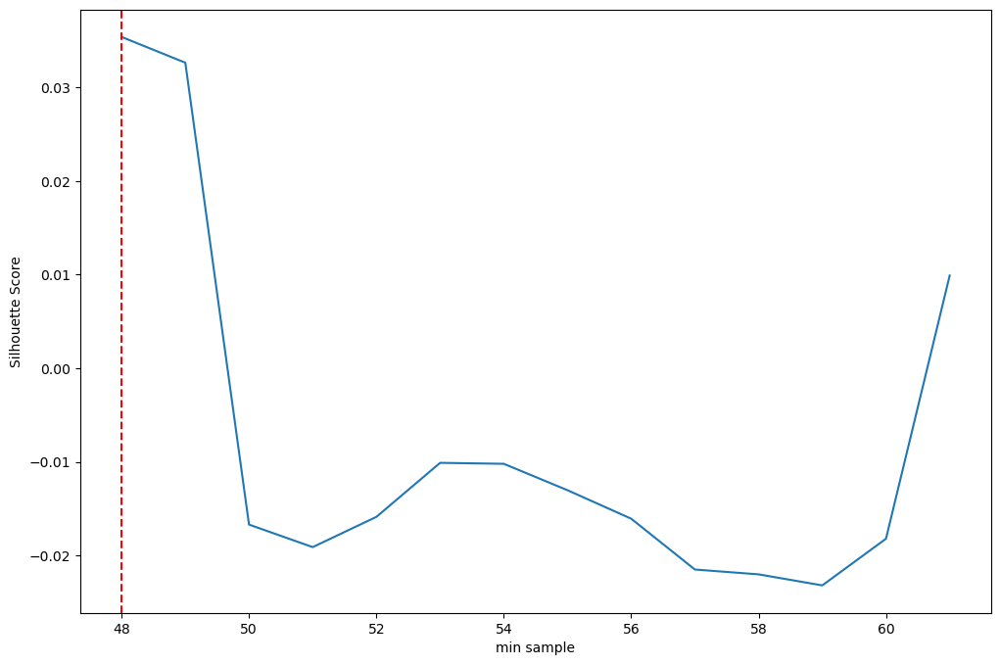

In [ ]:
#optimize DBSCAN
i = 48
sr = []
ms = []
while i < 62:
    dbs = hdbscan.HDBSCAN(min_cluster_size=5,min_samples=i)
    db_clust = dbs.fit_predict(scaled_df)
    sr.append(silhouette_score(scaled_df,db_clust))
    ms.append(i)
    i += 1
plt.plot(ms,sr)
plt.ylabel('Silhouette Score')
plt.xlabel('min sample')
plt.axvline(48,color='red',linestyle='--')
plt.show()

In [ ]:
hscan = hdbscan.HDBSCAN(min_cluster_size=4,min_samples=48)
hsc_clust = hscan.fit_predict(scaled_df)
silhouette_score(scaled_df,hsc_clust)

0.03537573009769592

In [ ]:
df['HDBSCAN Cluster'] = hsc_clust

In [ ]:
cluster_profiles_hdb = df.drop('Country',axis=1).groupby('HDBSCAN Cluster').mean()

# Analysis of different clustering Algorithms

## Num Clusters Formed

In [ ]:
num_clusters = {
    'Hierarchical Cluster':df['Hierarchical Cluster'].nunique(),
    'KMeans Cluster':df['KMeans Cluster'].nunique(),
    'DBSCAN Cluster':df['DBSCAN Cluster'].nunique(),
    'HDBSCAN Cluster':df['HDBSCAN Cluster'].nunique()
}
num_clusters = pd.DataFrame(num_clusters,index=['Num Clusters'])
num_clusters

,Hierarchical Cluster,KMeans Cluster,DBSCAN Cluster,HDBSCAN Cluster
Num Clusters,5,4,2,3


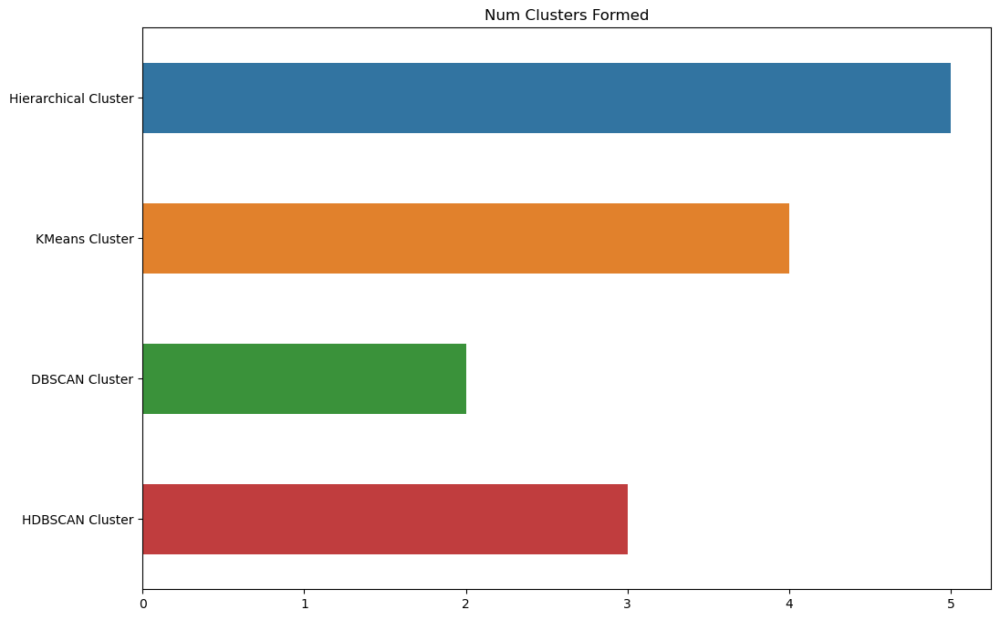

In [ ]:
sns.barplot(num_clusters,orient='h',width=0.5)
plt.title('Num Clusters Formed')
plt.show()

*  *Hierarchical Clustering algorithm forms 5 Clusters.*
*  *KMeans Clustering algorithm forms 4 Clusters.*
*  *DBSCAN Clustering algorithm forms 2 Clusters.*
*  *HDBSCAN Clustering algorithm forms 3 Clusters.*
*  *DBSCAN Clustering algorithm forms 2 Clusters with one cluster labeled as -1 as in EDA visualization we saw that data is densly close altogether.*

## Multi Variate Cluster analysis

### Tourism

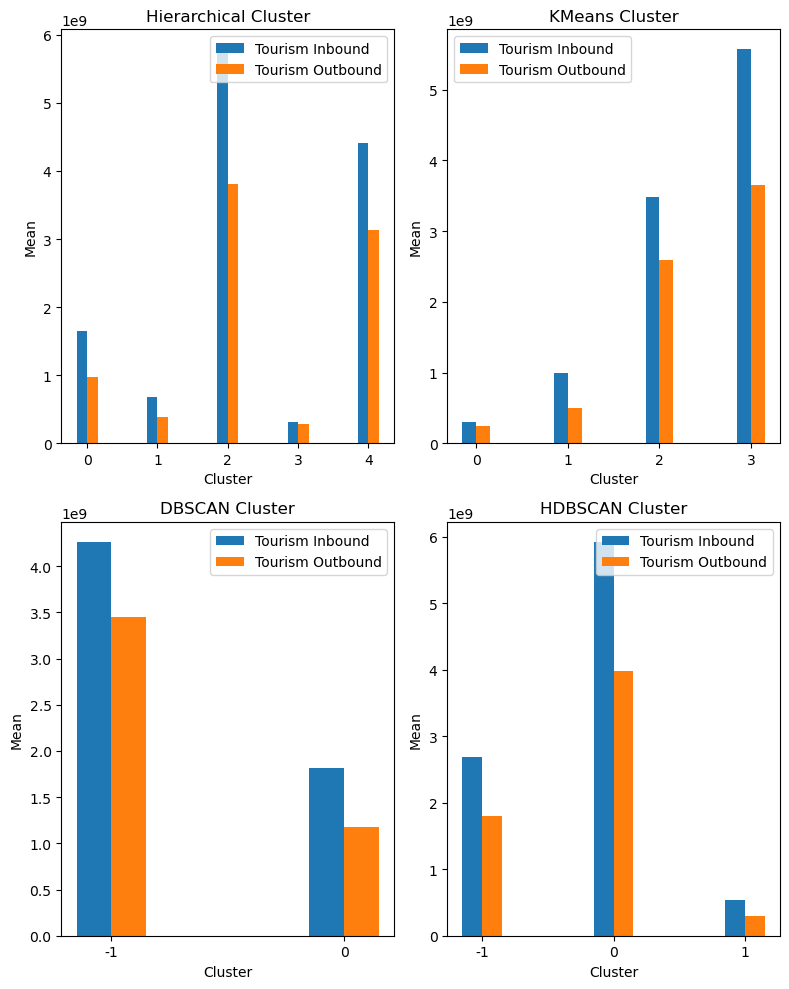

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(8, 10))

# Plot the first subplot
axs[0][0].set_title('Hierarchical Cluster')
plot_cluster_profile(cluster_profiles_hc, ['Tourism Inbound', 'Tourism Outbound'], df, 'Hierarchical Cluster', ax=axs[0][0])

# Plot the second subplot
axs[0][1].set_title('KMeans Cluster')
plot_cluster_profile(cluster_profiles_km, ['Tourism Inbound', 'Tourism Outbound'], df, 'KMeans Cluster', ax=axs[0][1])

# Plot the third subplot
axs[1][0].set_title('DBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_dbscan, ['Tourism Inbound', 'Tourism Outbound'], df, 'DBSCAN Cluster', ax=axs[1][0])

# Plot the fourth subplot
axs[1][1].set_title('HDBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_hdb, ['Tourism Inbound', 'Tourism Outbound'], df, 'HDBSCAN Cluster', ax=axs[1][1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

* *We can see similar trend for all the clustering algorithms, the general behaviour that we see is `Tourism inbound is higher than tourism outbound`.*

### Population

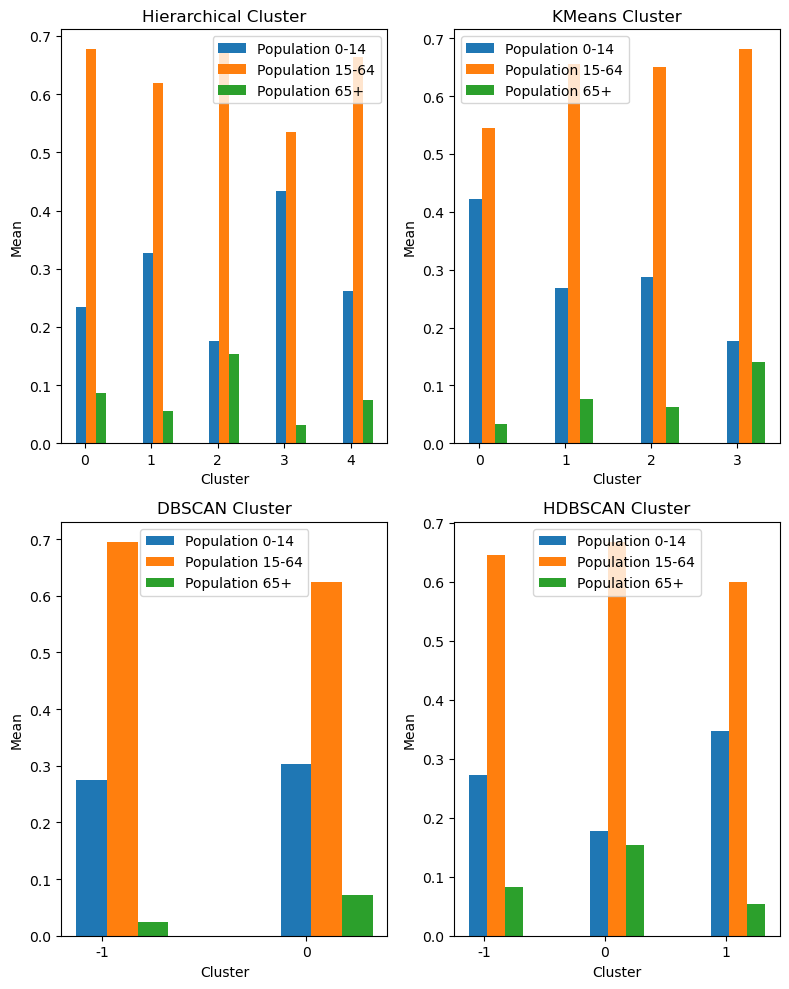

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(8, 10))

# Plot the first subplot
axs[0][0].set_title('Hierarchical Cluster')
plot_cluster_profile(cluster_profiles_hc, ['Population 0-14', 'Population 15-64','Population 65+'], df, 'Hierarchical Cluster', ax=axs[0][0])

# Plot the second subplot
axs[0][1].set_title('KMeans Cluster')
plot_cluster_profile(cluster_profiles_km, ['Population 0-14', 'Population 15-64','Population 65+'], df, 'KMeans Cluster', ax=axs[0][1])

# Plot the third subplot
axs[1][0].set_title('DBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_dbscan, ['Population 0-14', 'Population 15-64','Population 65+'], df, 'DBSCAN Cluster', ax=axs[1][0])

# Plot the fourth subplot
axs[1][1].set_title('HDBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_hdb, ['Population 0-14', 'Population 15-64','Population 65+'], df, 'HDBSCAN Cluster', ax=axs[1][1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

* *Population also show similar trend for all algorithm. `15-64 age group takes up maximum portion of population, Then comes 0-14 age group and finally 65+`.*

### Life expectency

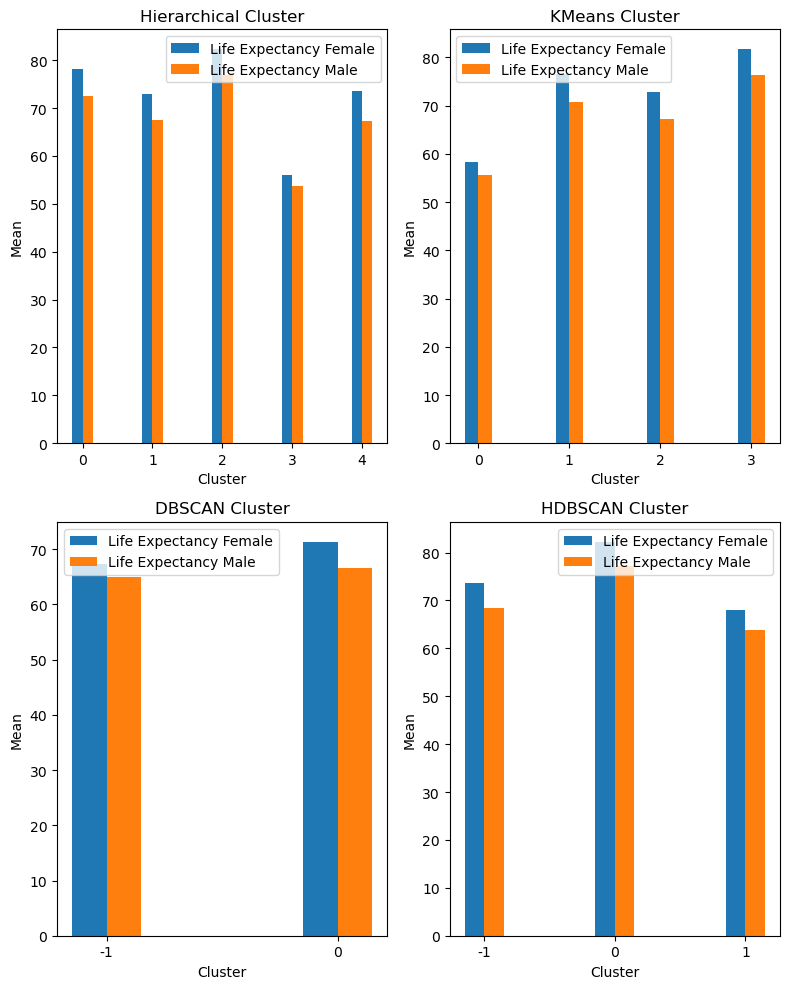

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(8, 10))

# Plot the first subplot
axs[0][0].set_title('Hierarchical Cluster')
plot_cluster_profile(cluster_profiles_hc, ['Life Expectancy Female', 'Life Expectancy Male'], df, 'Hierarchical Cluster', ax=axs[0][0])

# Plot the second subplot
axs[0][1].set_title('KMeans Cluster')
plot_cluster_profile(cluster_profiles_km, ['Life Expectancy Female', 'Life Expectancy Male'], df, 'KMeans Cluster', ax=axs[0][1])

# Plot the third subplot
axs[1][0].set_title('DBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_dbscan, ['Life Expectancy Female', 'Life Expectancy Male'], df, 'DBSCAN Cluster', ax=axs[1][0])

# Plot the fourth subplot
axs[1][1].set_title('HDBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_hdb, ['Life Expectancy Female', 'Life Expectancy Male'], df, 'HDBSCAN Cluster', ax=axs[1][1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

* *Every algorithm shows `Female life Expectancy is higher than male life expectancy`.*

###  Internet & Mobile usage

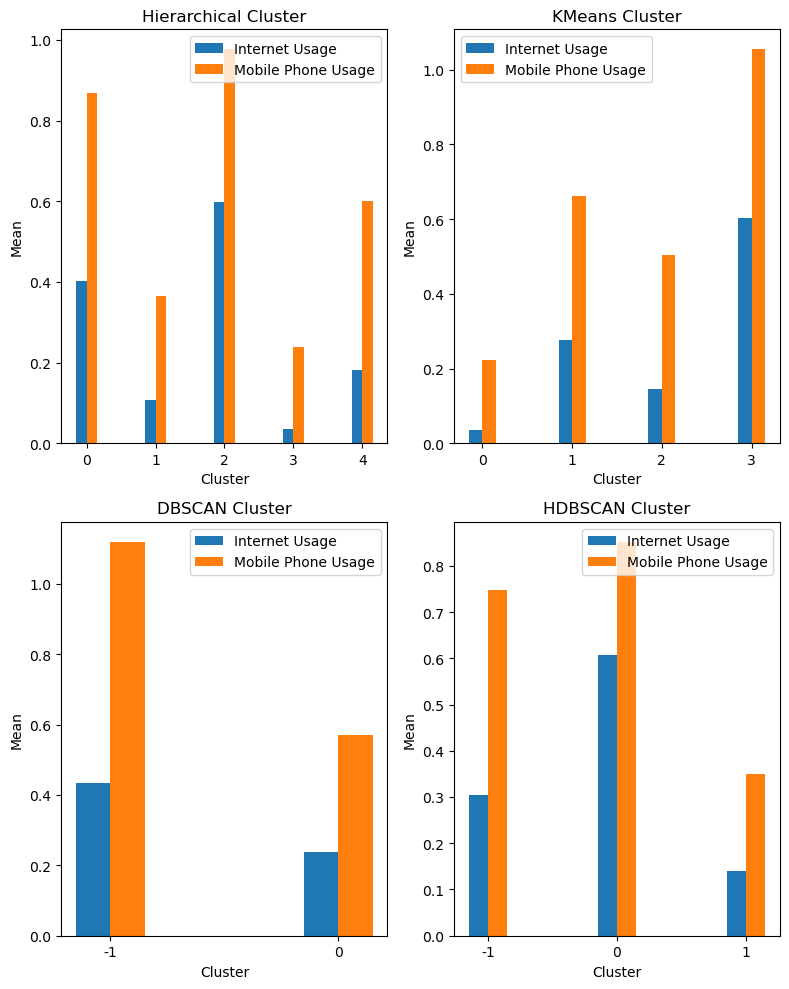

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(8, 10))

# Plot the first subplot
axs[0][0].set_title('Hierarchical Cluster')
plot_cluster_profile(cluster_profiles_hc, ['Internet Usage', 'Mobile Phone Usage'], df, 'Hierarchical Cluster', ax=axs[0][0])

# Plot the second subplot
axs[0][1].set_title('KMeans Cluster')
plot_cluster_profile(cluster_profiles_km, ['Internet Usage', 'Mobile Phone Usage'], df, 'KMeans Cluster', ax=axs[0][1])

# Plot the third subplot
axs[1][0].set_title('DBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_dbscan, ['Internet Usage', 'Mobile Phone Usage'], df, 'DBSCAN Cluster', ax=axs[1][0])

# Plot the fourth subplot
axs[1][1].set_title('HDBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_hdb, ['Internet Usage', 'Mobile Phone Usage'], df, 'HDBSCAN Cluster', ax=axs[1][1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

### Birth & Infant Mortality rate

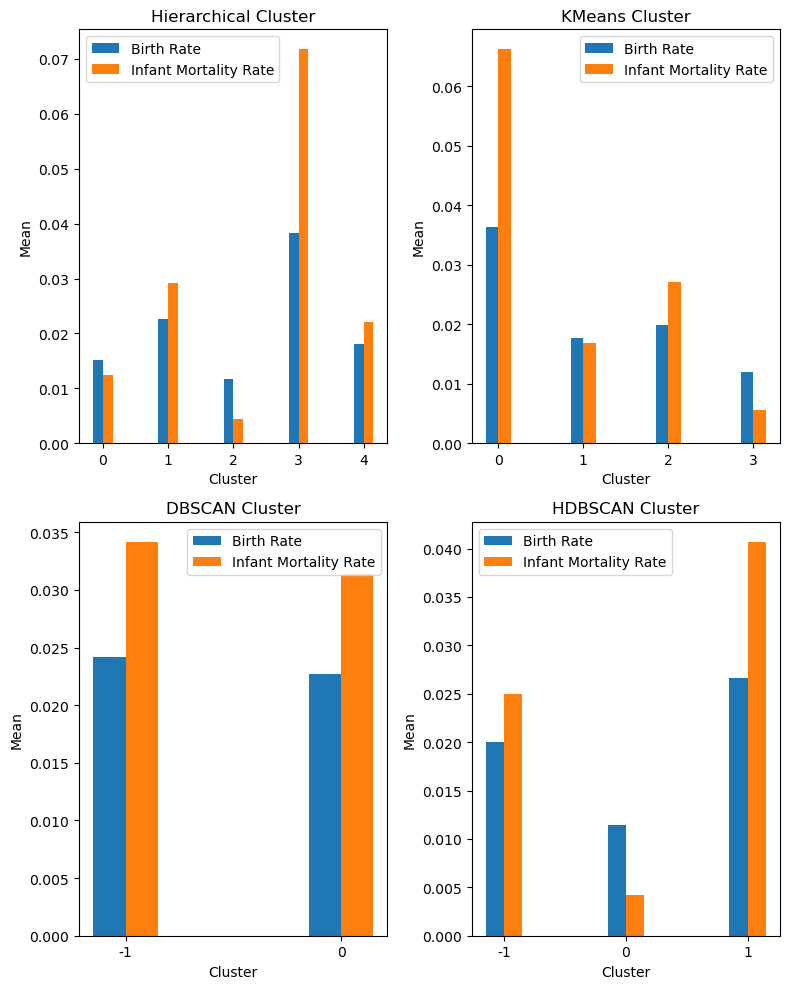

In [ ]:

fig, axs = plt.subplots(2, 2, figsize=(8, 10))

# Plot the first subplot
axs[0][0].set_title('Hierarchical Cluster')
plot_cluster_profile(cluster_profiles_hc, ['Birth Rate', 'Infant Mortality Rate'], df, 'Hierarchical Cluster', ax=axs[0][0])

# Plot the second subplot
axs[0][1].set_title('KMeans Cluster')
plot_cluster_profile(cluster_profiles_km, ['Birth Rate', 'Infant Mortality Rate'], df, 'KMeans Cluster', ax=axs[0][1])

# Plot the third subplot
axs[1][0].set_title('DBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_dbscan, ['Birth Rate', 'Infant Mortality Rate'], df, 'DBSCAN Cluster', ax=axs[1][0])

# Plot the fourth subplot
axs[1][1].set_title('HDBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_hdb, ['Birth Rate', 'Infant Mortality Rate'], df, 'HDBSCAN Cluster', ax=axs[1][1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

### Energy & Emissions

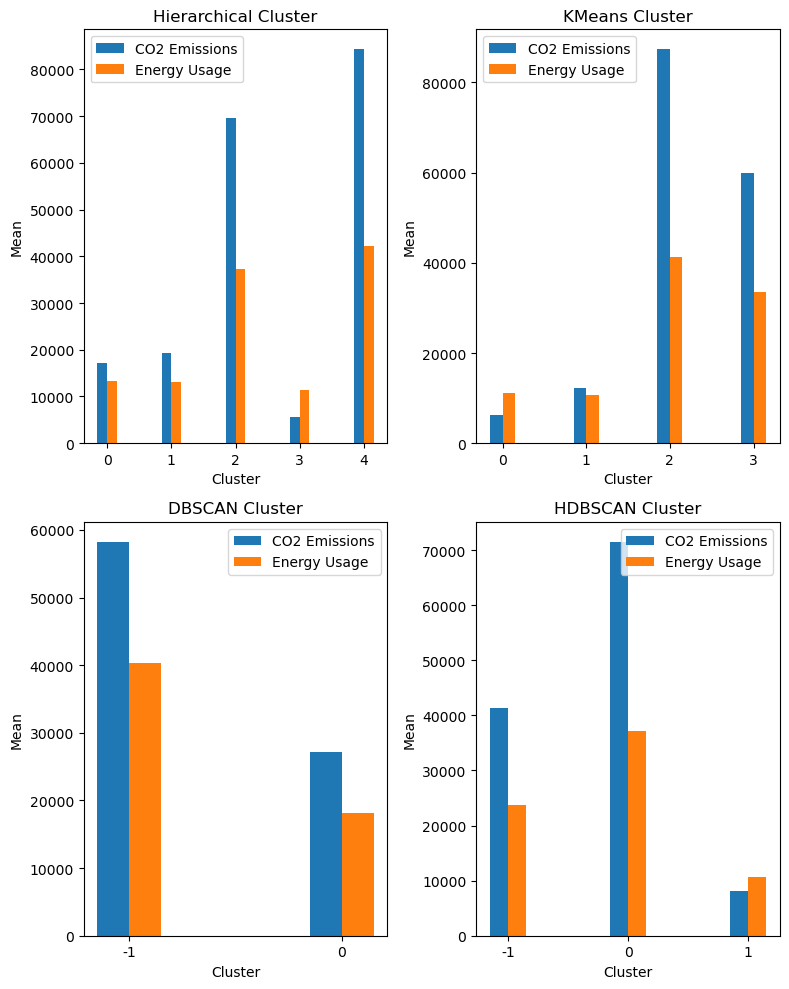

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(8, 10))

# Plot the first subplot
axs[0][0].set_title('Hierarchical Cluster')
plot_cluster_profile(cluster_profiles_hc, ['CO2 Emissions', 'Energy Usage'], df, 'Hierarchical Cluster', ax=axs[0][0])

# Plot the second subplot
axs[0][1].set_title('KMeans Cluster')
plot_cluster_profile(cluster_profiles_km, ['CO2 Emissions', 'Energy Usage'], df, 'KMeans Cluster', ax=axs[0][1])

# Plot the third subplot
axs[1][0].set_title('DBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_dbscan, ['CO2 Emissions', 'Energy Usage'], df, 'DBSCAN Cluster', ax=axs[1][0])

# Plot the fourth subplot
axs[1][1].set_title('HDBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_hdb, ['CO2 Emissions', 'Energy Usage'], df, 'HDBSCAN Cluster', ax=axs[1][1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

### Business related

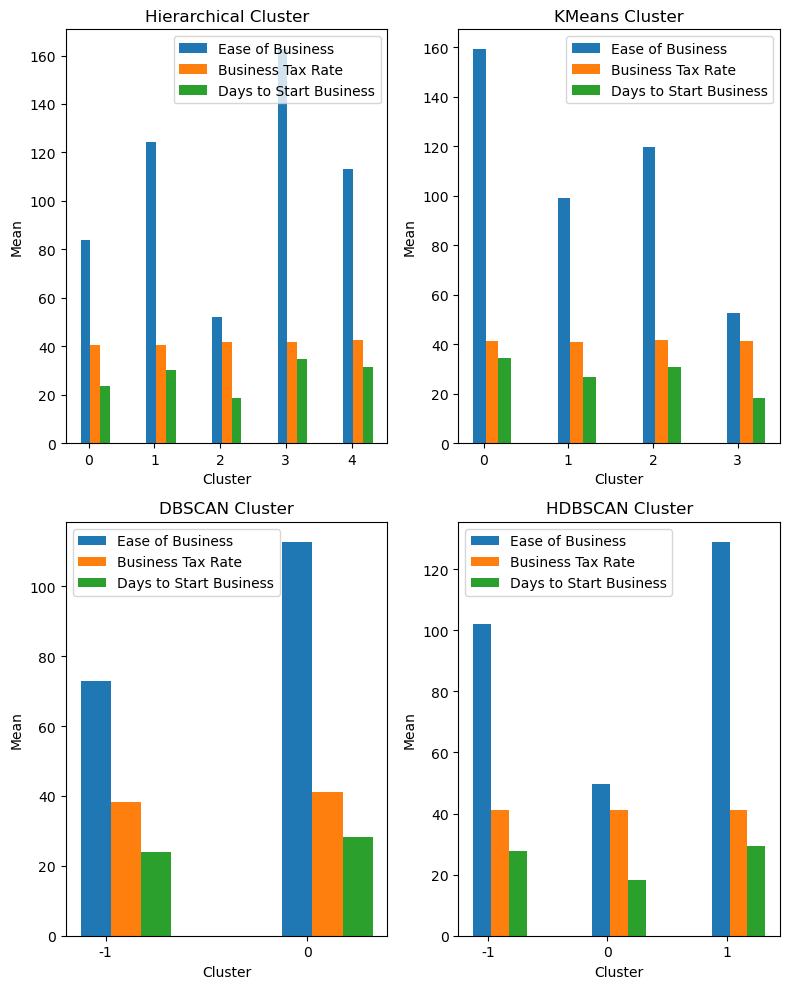

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(8, 10))

# Plot the first subplot
axs[0][0].set_title('Hierarchical Cluster')
plot_cluster_profile(cluster_profiles_hc, ['Ease of Business','Business Tax Rate','Days to Start Business'], df, 'Hierarchical Cluster', ax=axs[0][0])

# Plot the second subplot
axs[0][1].set_title('KMeans Cluster')
plot_cluster_profile(cluster_profiles_km, ['Ease of Business','Business Tax Rate','Days to Start Business'], df, 'KMeans Cluster', ax=axs[0][1])

# Plot the third subplot
axs[1][0].set_title('DBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_dbscan, ['Ease of Business','Business Tax Rate','Days to Start Business'], df, 'DBSCAN Cluster', ax=axs[1][0])

# Plot the fourth subplot
axs[1][1].set_title('HDBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_hdb, ['Ease of Business','Business Tax Rate','Days to Start Business'], df, 'HDBSCAN Cluster', ax=axs[1][1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

## Univariate Cluster analysis

### Hours to do tax

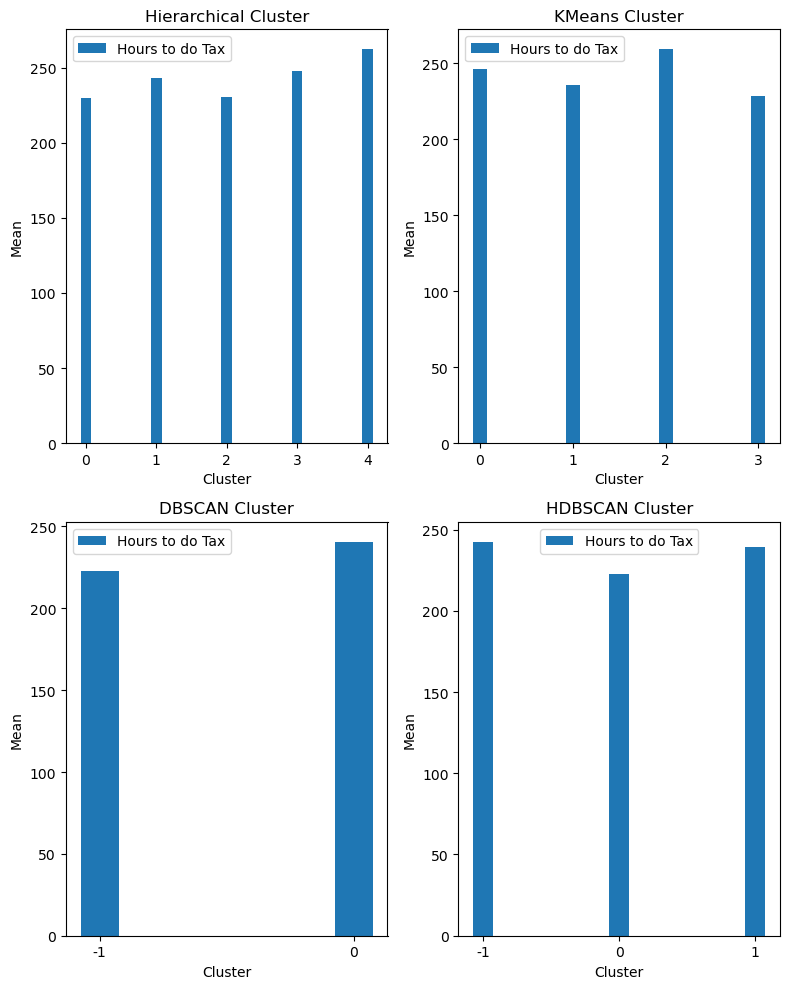

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(8, 10))

# Plot the first subplot
axs[0][0].set_title('Hierarchical Cluster')
plot_cluster_profile(cluster_profiles_hc, ['Hours to do Tax'], df, 'Hierarchical Cluster', ax=axs[0][0])

# Plot the second subplot
axs[0][1].set_title('KMeans Cluster')
plot_cluster_profile(cluster_profiles_km, ['Hours to do Tax'], df, 'KMeans Cluster', ax=axs[0][1])

# Plot the third subplot
axs[1][0].set_title('DBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_dbscan, ['Hours to do Tax'], df, 'DBSCAN Cluster', ax=axs[1][0])

# Plot the fourth subplot
axs[1][1].set_title('HDBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_hdb, ['Hours to do Tax'], df, 'HDBSCAN Cluster', ax=axs[1][1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

### Health Exp % GDP

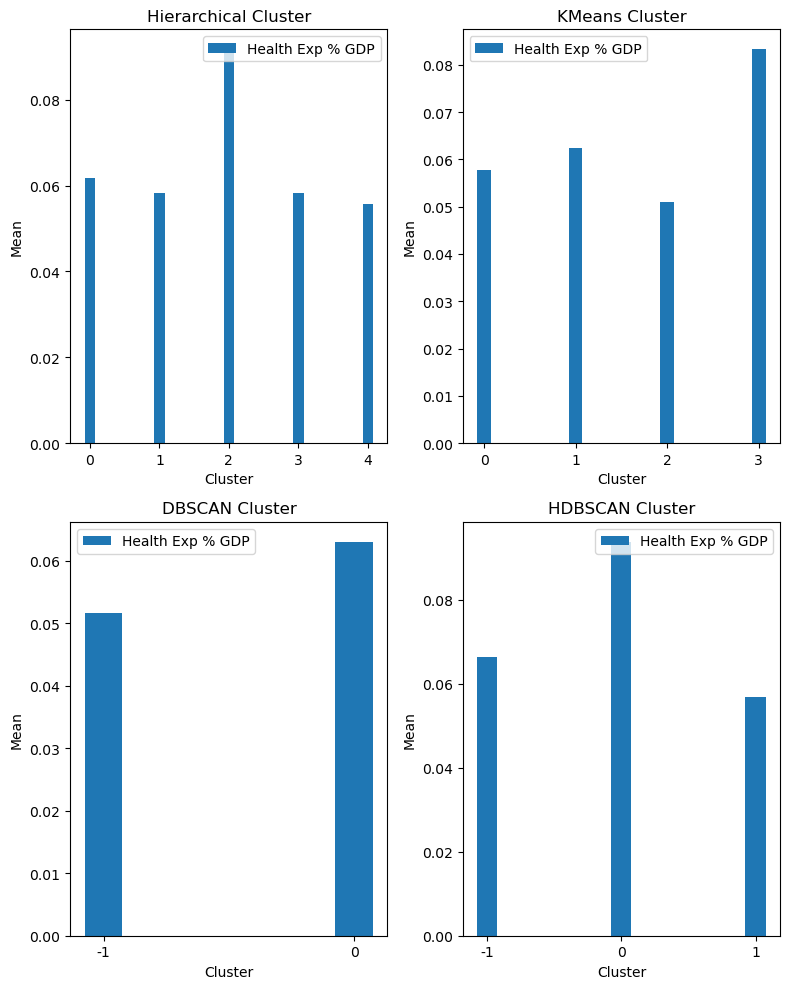

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(8, 10))

# Plot the first subplot
axs[0][0].set_title('Hierarchical Cluster')
plot_cluster_profile(cluster_profiles_hc, ['Health Exp % GDP'], df, 'Hierarchical Cluster', ax=axs[0][0])

# Plot the second subplot
axs[0][1].set_title('KMeans Cluster')
plot_cluster_profile(cluster_profiles_km, ['Health Exp % GDP'], df, 'KMeans Cluster', ax=axs[0][1])

# Plot the third subplot
axs[1][0].set_title('DBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_dbscan, ['Health Exp % GDP'], df, 'DBSCAN Cluster', ax=axs[1][0])

# Plot the fourth subplot
axs[1][1].set_title('HDBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_hdb, ['Health Exp % GDP'], df, 'HDBSCAN Cluster', ax=axs[1][1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

### Health Exp/Capita

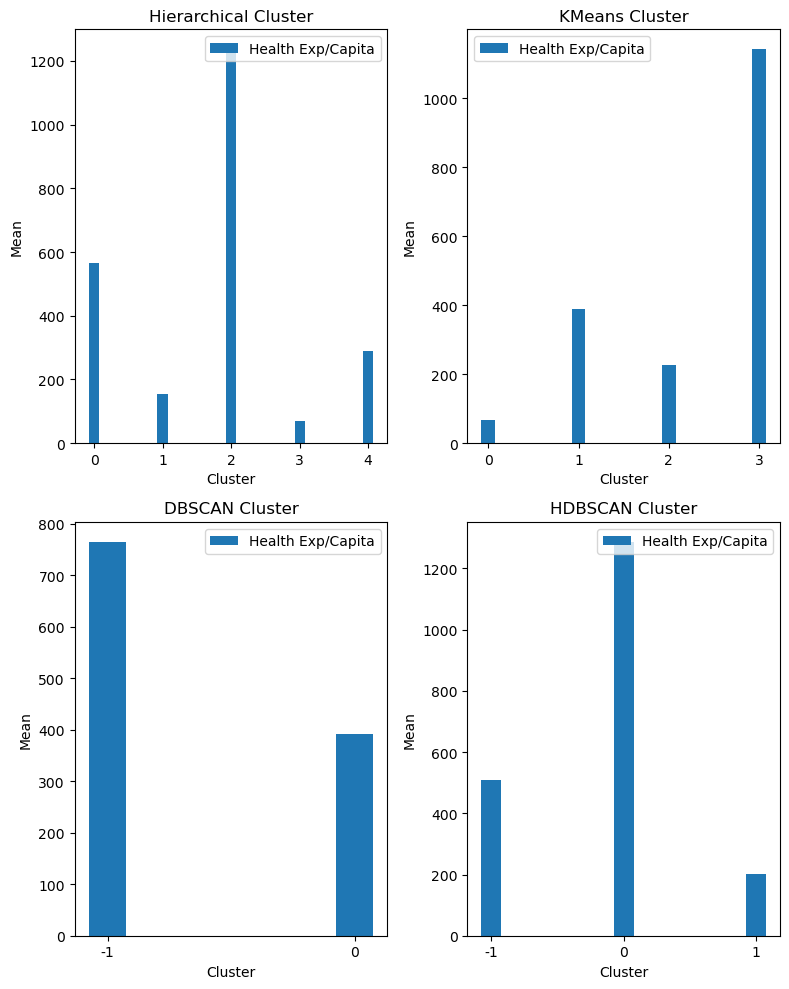

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(8, 10))

# Plot the first subplot
axs[0][0].set_title('Hierarchical Cluster')
plot_cluster_profile(cluster_profiles_hc, ['Health Exp/Capita'], df, 'Hierarchical Cluster', ax=axs[0][0])

# Plot the second subplot
axs[0][1].set_title('KMeans Cluster')
plot_cluster_profile(cluster_profiles_km, ['Health Exp/Capita'], df, 'KMeans Cluster', ax=axs[0][1])

# Plot the third subplot
axs[1][0].set_title('DBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_dbscan, ['Health Exp/Capita'], df, 'DBSCAN Cluster', ax=axs[1][0])

# Plot the fourth subplot
axs[1][1].set_title('HDBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_hdb, ['Health Exp/Capita'], df, 'HDBSCAN Cluster', ax=axs[1][1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

### GDP

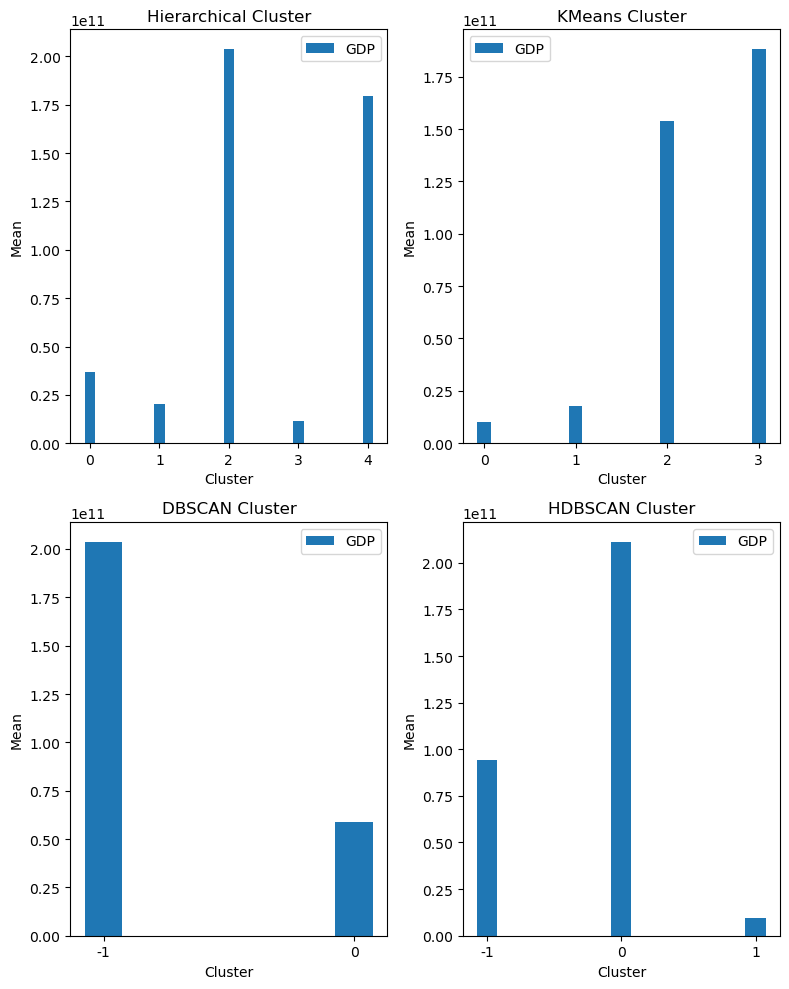

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(8, 10))

# Plot the first subplot
axs[0][0].set_title('Hierarchical Cluster')
plot_cluster_profile(cluster_profiles_hc, ['GDP'], df, 'Hierarchical Cluster', ax=axs[0][0])

# Plot the second subplot
axs[0][1].set_title('KMeans Cluster')
plot_cluster_profile(cluster_profiles_km, ['GDP'], df, 'KMeans Cluster', ax=axs[0][1])

# Plot the third subplot
axs[1][0].set_title('DBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_dbscan, ['GDP'], df, 'DBSCAN Cluster', ax=axs[1][0])

# Plot the fourth subplot
axs[1][1].set_title('HDBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_hdb, ['GDP'], df, 'HDBSCAN Cluster', ax=axs[1][1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

### Lending interest

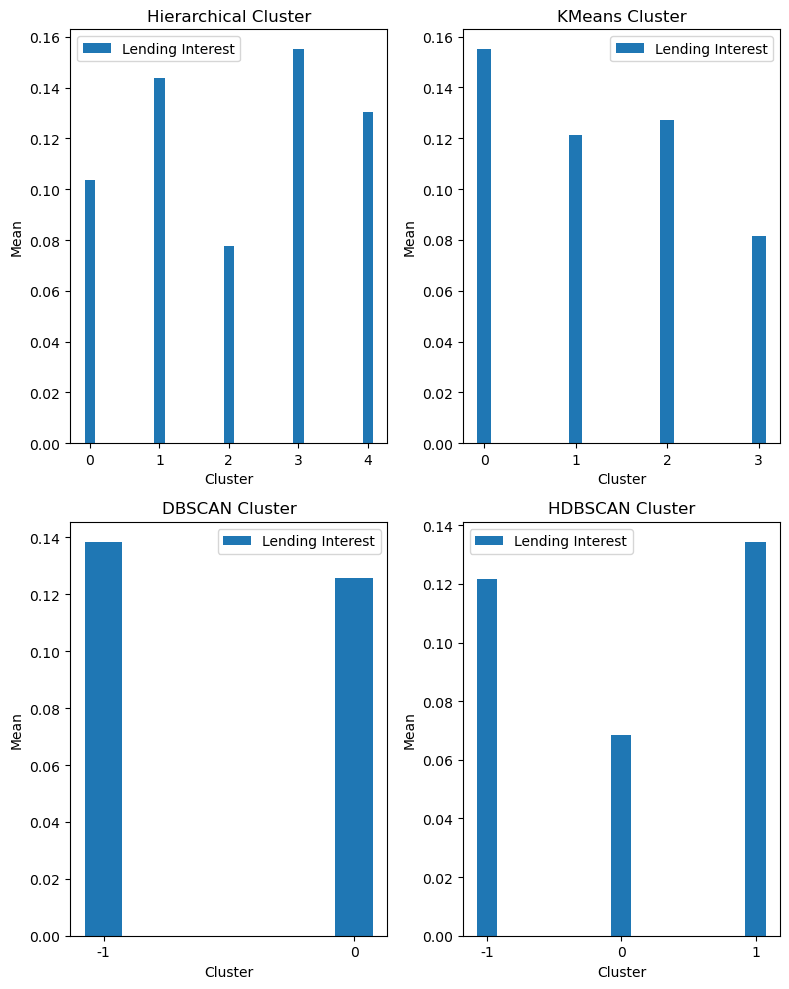

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(8, 10))

# Plot the first subplot
axs[0][0].set_title('Hierarchical Cluster')
plot_cluster_profile(cluster_profiles_hc, ['Lending Interest'], df, 'Hierarchical Cluster', ax=axs[0][0])

# Plot the second subplot
axs[0][1].set_title('KMeans Cluster')
plot_cluster_profile(cluster_profiles_km, ['Lending Interest'], df, 'KMeans Cluster', ax=axs[0][1])

# Plot the third subplot
axs[1][0].set_title('DBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_dbscan, ['Lending Interest'], df, 'DBSCAN Cluster', ax=axs[1][0])

# Plot the fourth subplot
axs[1][1].set_title('HDBSCAN Cluster')
plot_cluster_profile_neg(cluster_profiles_hdb, ['Lending Interest'], df, 'HDBSCAN Cluster', ax=axs[1][1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

### Algorithm Comparison

In [ ]:
data = {
    'Hierarchical' : silhouette_score(scaled_df,df['Hierarchical Cluster']),
    'KMeans' : silhouette_score(scaled_df,df['KMeans Cluster']),
    'DBSCAN' : silhouette_score(scaled_df,df['DBSCAN Cluster']),
    'HDBSCAN' : silhouette_score(scaled_df,df['HDBSCAN Cluster'])
}
stat = pd.DataFrame(data,index=['Score'])
stat

,Hierarchical,KMeans,DBSCAN,HDBSCAN
Score,0.172279,0.270674,0.198971,0.035376


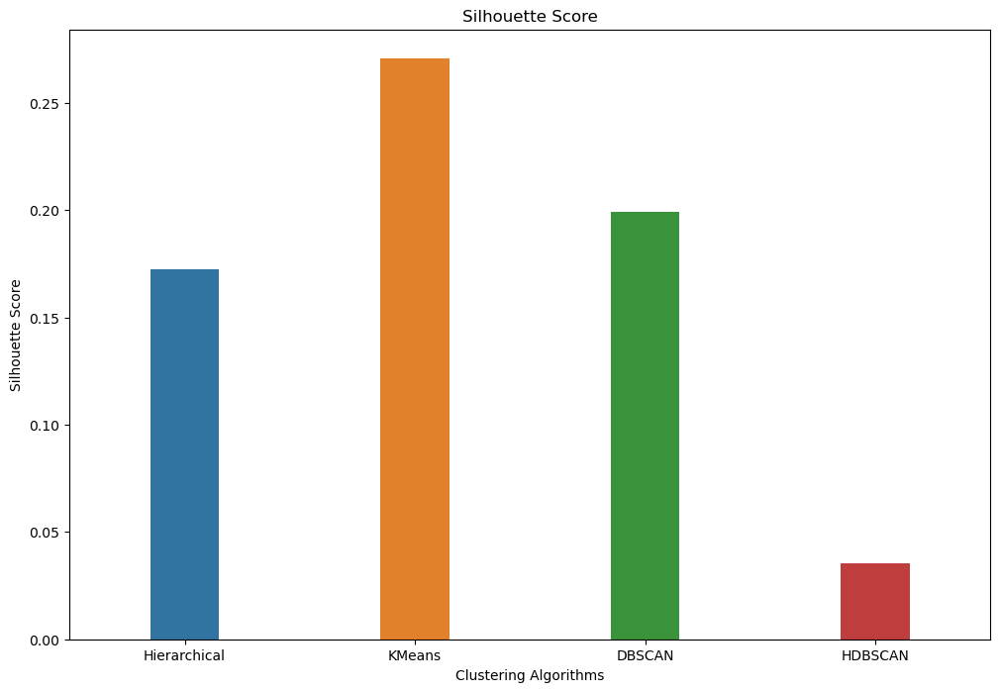

In [ ]:
plt.title('Silhouette Score')
sns.barplot(stat,width=0.3)
plt.xlabel('Clustering Algorithms')
plt.ylabel('Silhouette Score')
plt.show()

*KMeans has best Silhoutte Score and is preferably better algorithm to use.*

*Ideal Number of clusters formed depends on business case instead of Silhoutte score, though silhoutte score is still used to evaluate algorithms.*

In [ ]:
df.to_csv('Clustered Data.csv',index=False)

# Classification

Using KMeans Labeled Data

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , confusion_matrix

In [ ]:
df = pd.read_csv('./Clustered Data.csv')
df.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,...,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound,Country,Hierarchical Cluster,KMeans Cluster,DBSCAN Cluster,HDBSCAN Cluster
0,0.020,41.0,87931.0,26.0,138.0,26998.0,5.479006e+10,0.035,60.0,239.0,...,0.039,31719449.0,0.599,102000000.0,193000000.0,Algeria,1,2,0,1
1,0.050,41.0,9542.0,26.0,168.0,7499.0,9.129595e+09,0.034,22.0,239.0,...,0.025,13924930.0,0.324,34000000.0,146000000.0,Angola,3,0,0,1
2,0.043,41.0,1617.0,26.0,170.0,1983.0,2.359122e+09,0.043,15.0,239.0,...,0.029,6949366.0,0.383,77000000.0,50000000.0,Benin,3,0,0,1
3,0.027,41.0,4276.0,26.0,143.0,1836.0,5.788312e+09,0.047,152.0,239.0,...,0.029,1755375.0,0.532,227000000.0,209000000.0,Botswana,3,0,0,1
4,0.046,41.0,1041.0,26.0,171.0,14338.0,2.610959e+09,0.051,12.0,239.0,...,0.028,11607944.0,0.178,23000000.0,30000000.0,Burkina Faso,3,0,0,1


In [ ]:
df.drop(['Hierarchical Cluster','DBSCAN Cluster','HDBSCAN Cluster','Country'],axis=1,inplace=True)

In [ ]:
df

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,...,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound,KMeans Cluster
0,0.020000,41.00,87931.0,26.000,138.0,26998.000,5.479006e+10,0.035,60.000,239.00,...,0.0,1,0.342000,0.6190,0.039,3.171945e+07,0.599,1.020000e+08,1.930000e+08,2
1,0.050000,41.00,9542.0,26.000,168.0,7499.000,9.129595e+09,0.034,22.000,239.00,...,0.0,1,0.476000,0.4990,0.025,1.392493e+07,0.324,3.400000e+07,1.460000e+08,0
2,0.043000,41.00,1617.0,26.000,170.0,1983.000,2.359122e+09,0.043,15.000,239.00,...,0.0,1,0.454000,0.5170,0.029,6.949366e+06,0.383,7.700000e+07,5.000000e+07,0
3,0.027000,41.00,4276.0,26.000,143.0,1836.000,5.788312e+09,0.047,152.000,239.00,...,0.1,1,0.383000,0.5870,0.029,1.755375e+06,0.532,2.270000e+08,2.090000e+08,0
4,0.046000,41.00,1041.0,26.000,171.0,14338.000,2.610959e+09,0.051,12.000,239.00,...,0.0,1,0.468000,0.5050,0.028,1.160794e+07,0.178,2.300000e+07,3.000000e+07,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.022715,41.00,8529.0,26.000,110.0,14338.000,1.507975e+10,0.061,193.000,239.00,...,0.5,1,0.303051,0.6425,0.052,3.242700e+04,0.911,6.885000e+08,4.560000e+08,1
2700,0.013000,45.15,8529.0,5.000,4.0,46913.625,2.213750e+11,0.118,1291.125,189.75,...,1.0,1,0.196000,0.6670,0.136,4.903473e+07,0.811,6.341000e+09,4.058250e+09,3
2701,0.015000,41.90,8529.0,7.000,85.0,14338.000,5.000435e+10,0.089,1291.125,295.75,...,1.5,1,0.220000,0.6390,0.140,3.395253e+06,0.948,2.222000e+09,1.028000e+09,1
2702,0.020000,45.15,8529.0,55.625,180.0,14338.000,2.213750e+11,0.046,593.000,295.75,...,1.0,1,0.288000,0.6520,0.060,2.995478e+07,0.889,9.040000e+08,3.202000e+09,2


In [ ]:
X = df.drop('KMeans Cluster',axis=1)
Y = df['KMeans Cluster']

In [ ]:
xtrain,xtest,ytrain,ytest = train_test_split(X,Y,test_size=0.2,random_state=42)

## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rfcf = RandomForestClassifier().fit(xtrain,ytrain)
rfcf.score(xtest,ytest)

0.9759704251386322

In [ ]:
print(classification_report(ytest,rfcf.predict(xtest)))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       181
           1       0.98      0.97      0.97       220
           2       0.94      1.00      0.97        50
           3       0.97      0.98      0.97        90

    accuracy                           0.98       541
   macro avg       0.97      0.98      0.97       541
weighted avg       0.98      0.98      0.98       541



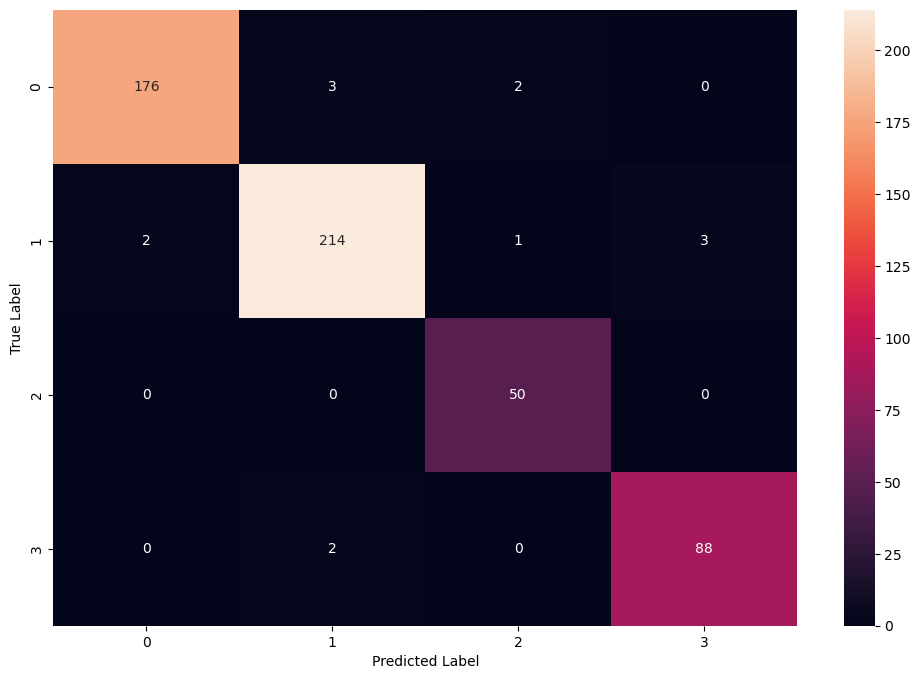

In [ ]:
sns.heatmap(confusion_matrix(ytest,rfcf.predict(xtest)),annot=True,fmt='.0f')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

## LinearSVC

In [ ]:
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler

In [ ]:
std = StandardScaler()
X_scaled = std.fit_transform(X)

In [ ]:
xstrain,xstest,ystrain,ystest = train_test_split(X_scaled,Y,test_size=0.2,random_state=42)

In [ ]:
svc = LinearSVC().fit(xstrain,ystrain)
svc.score(xstest,ystest)

0.9704251386321626

In [ ]:
print(classification_report(ystest,svc.predict(xstest)))

              precision    recall  f1-score   support

           0       0.99      0.95      0.97       181
           1       0.95      0.99      0.97       220
           2       0.94      0.96      0.95        50
           3       0.99      0.98      0.98        90

    accuracy                           0.97       541
   macro avg       0.97      0.97      0.97       541
weighted avg       0.97      0.97      0.97       541



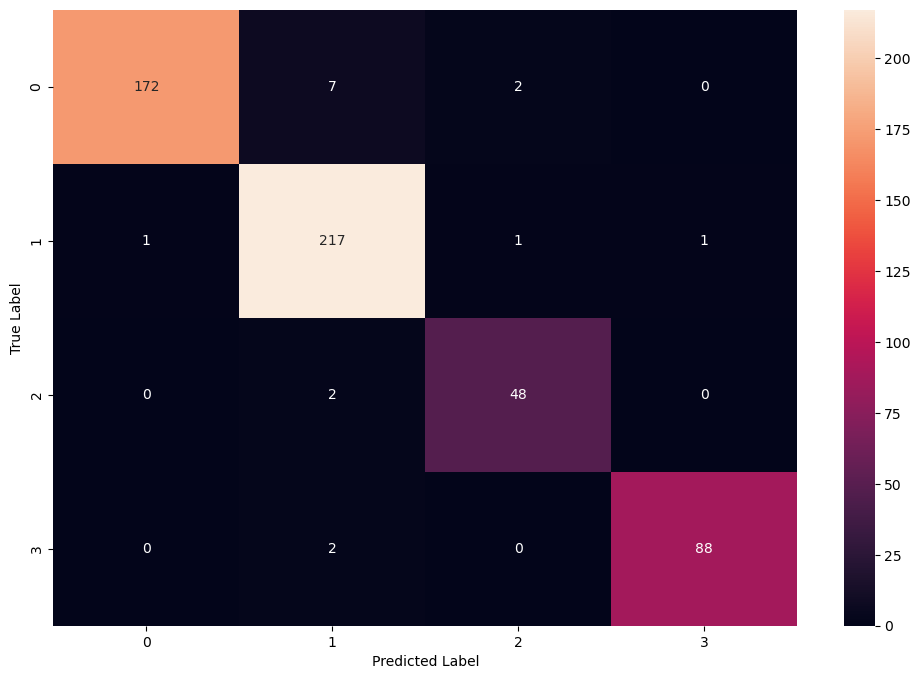

In [ ]:
sns.heatmap(confusion_matrix(ystest,svc.predict(xstest)),annot=True,fmt='.0f')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

## KNN Classifier

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
knn = KNeighborsClassifier(weights='distance').fit(xstrain,ystrain)
knn.score(xstest,ystest)

0.9593345656192237

In [ ]:
print(classification_report(ystest,knn.predict(xstest)))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       181
           1       0.95      0.96      0.96       220
           2       0.96      0.96      0.96        50
           3       0.93      0.94      0.94        90

    accuracy                           0.96       541
   macro avg       0.96      0.96      0.96       541
weighted avg       0.96      0.96      0.96       541



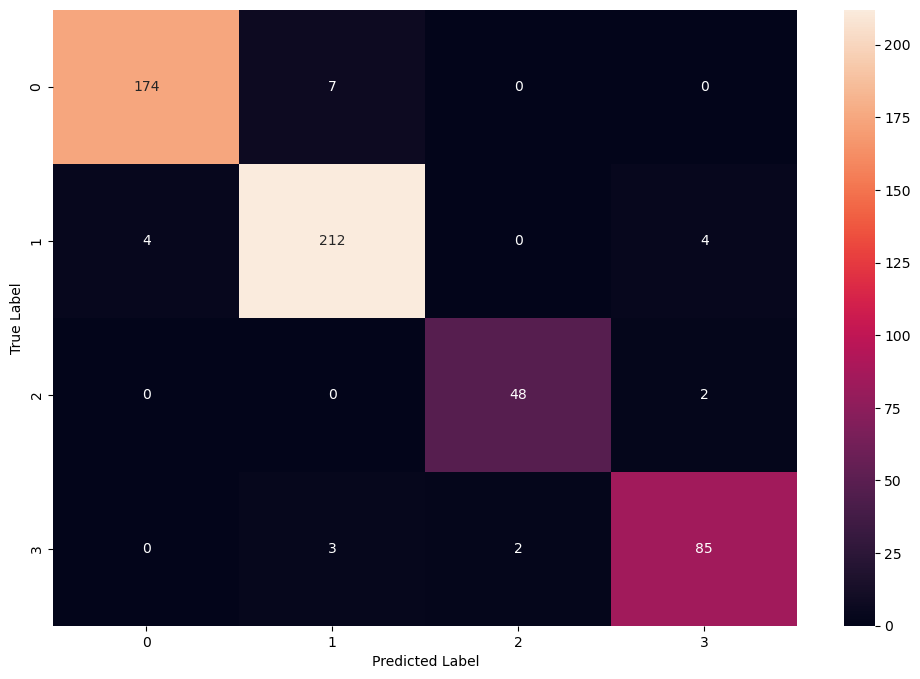

In [ ]:
sns.heatmap(confusion_matrix(ystest,knn.predict(xstest)),annot=True,fmt='.0f')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

## AdaBoost

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

In [ ]:
ada = AdaBoostClassifier().fit(xtrain,ytrain)
ada.score(xtest,ytest)

0.8114602587800369

In [ ]:
print(classification_report(ytest,ada.predict(xtest)))

              precision    recall  f1-score   support

           0       0.91      0.90      0.90       181
           1       0.96      0.80      0.87       220
           2       0.40      0.24      0.30        50
           3       0.60      0.97      0.74        90

    accuracy                           0.81       541
   macro avg       0.71      0.73      0.70       541
weighted avg       0.83      0.81      0.81       541



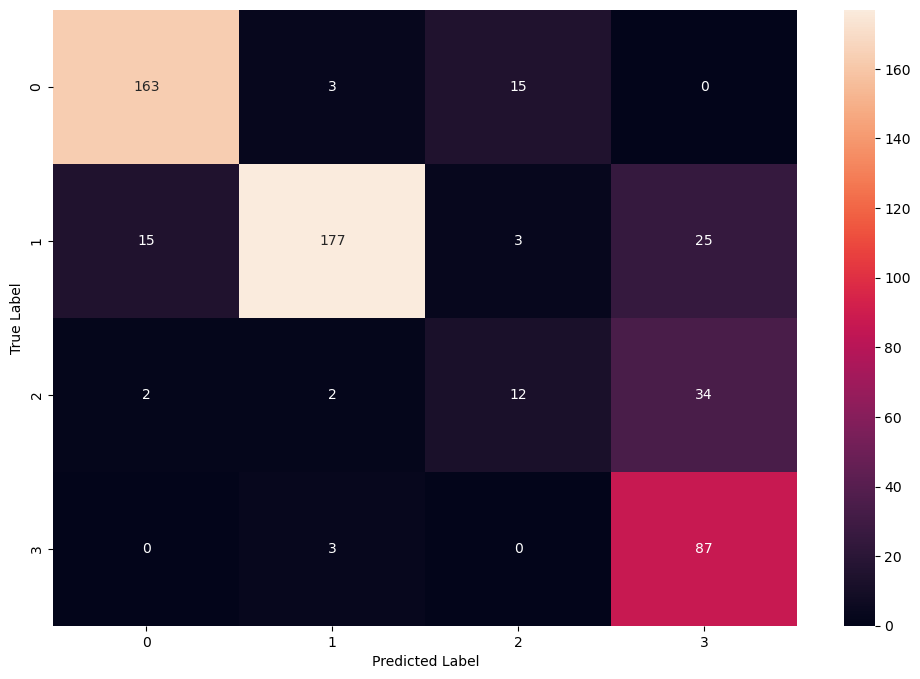

In [ ]:
sns.heatmap(confusion_matrix(ytest,ada.predict(xtest)),annot=True,fmt='.0f')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

## Catboost

In [ ]:
from catboost import CatBoostClassifier

In [ ]:
cbcf = CatBoostClassifier(verbose=0).fit(xtrain,ytrain)
cbcf.score(xtest,ytest)

0.9796672828096118

In [ ]:
print(classification_report(ytest,cbcf.predict(xtest)))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98       181
           1       0.98      0.98      0.98       220
           2       0.98      1.00      0.99        50
           3       0.97      0.98      0.97        90

    accuracy                           0.98       541
   macro avg       0.98      0.98      0.98       541
weighted avg       0.98      0.98      0.98       541



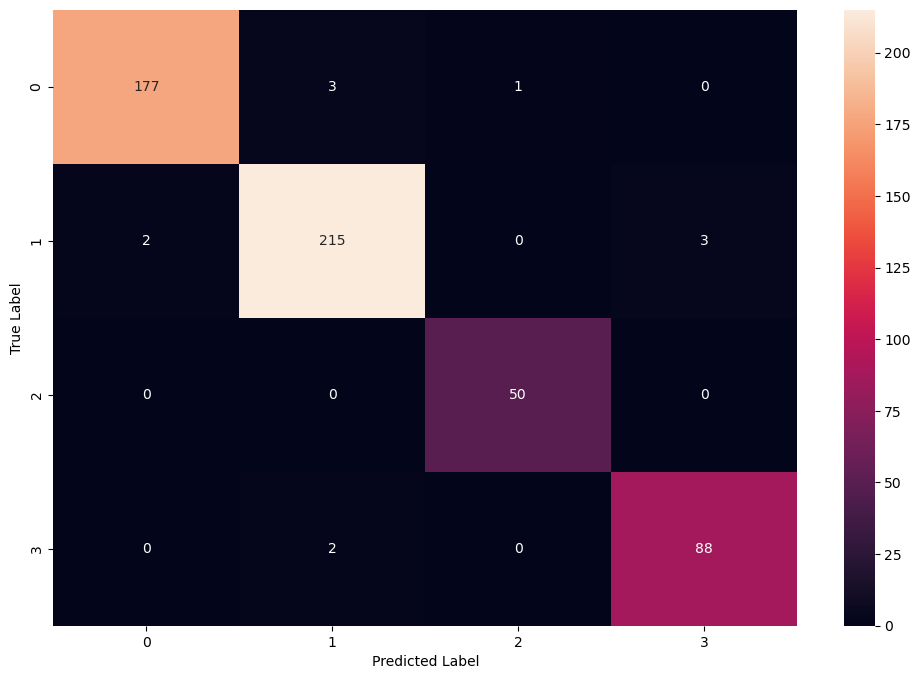

In [ ]:
sns.heatmap(confusion_matrix(ytest,cbcf.predict(xtest)),annot=True,fmt='.0f')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

## SGD

In [ ]:
from sklearn.linear_model import SGDClassifier

In [ ]:
sgd = SGDClassifier().fit(xstrain,ystrain)
sgd.score(xstest,ystest)

0.9685767097966729

In [ ]:
print(classification_report(ystest,sgd.predict(xstest)))

              precision    recall  f1-score   support

           0       0.99      0.96      0.97       181
           1       0.94      0.99      0.96       220
           2       0.98      0.94      0.96        50
           3       0.99      0.96      0.97        90

    accuracy                           0.97       541
   macro avg       0.98      0.96      0.97       541
weighted avg       0.97      0.97      0.97       541



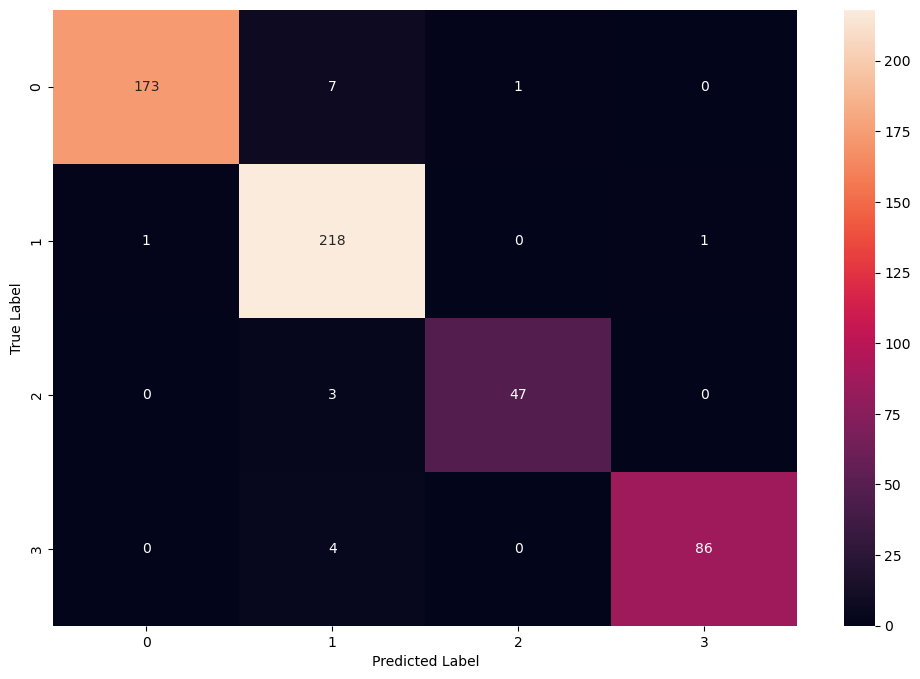

In [ ]:
sns.heatmap(confusion_matrix(ystest,sgd.predict(xstest)),annot=True,fmt='.0f')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

### Model Evaluation

In [ ]:
scr = {
    'Random Forest' : [rfcf.score(xtest,ytest)],
    'Linear SVC' : [svc.score(xstest,ystest)],
    'KNN' : [knn.score(xstest,ystest)],
    'AdaBoost' : [ada.score(xtest,ytest)],
    'CatBoost' : [cbcf.score(xtest,ytest)],
    'SGD' : [sgd.score(xstest,ystest)]
}
model_score = pd.DataFrame(scr,index=['Score'])
model_score

,Random Forest,Linear SVC,KNN,AdaBoost,CatBoost,SGD
Score,0.97597,0.970425,0.959335,0.81146,0.979667,0.968577


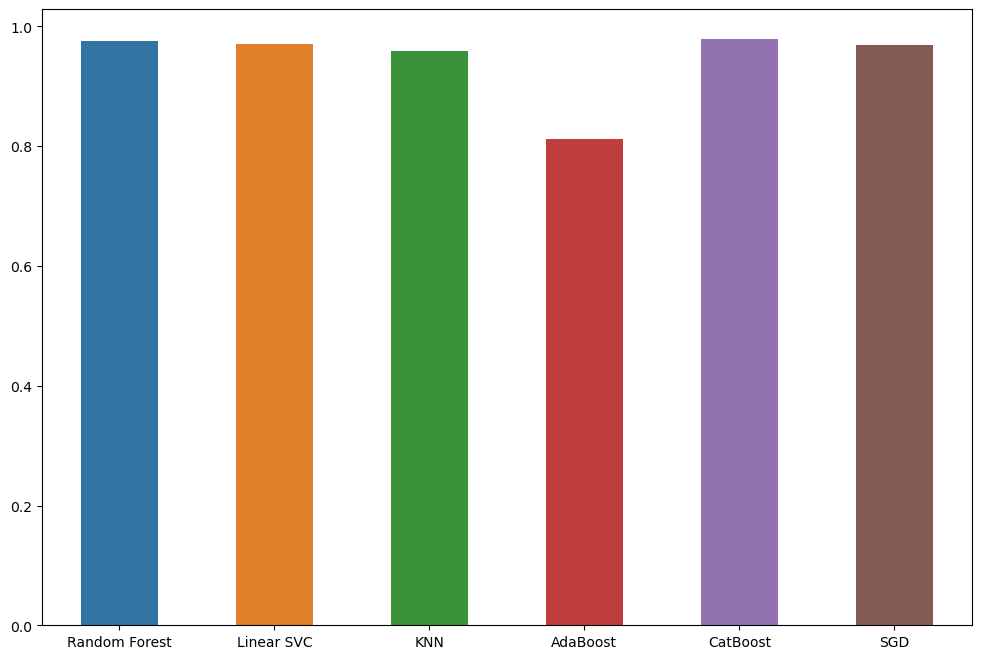

In [ ]:
sns.barplot(model_score,width=0.5)
plt.show()

*CatBoost Performs Best.*

In [ ]:
import pickle as pkl

In [ ]:
cb = CatBoostClassifier(verbose=0).fit(X,Y)
pkl.dump(cb,open('./Deployment/catboost.h5','wb'))